# E-Commerce Marketing Analytics 
#### BY: NITISH SINGH

## Problem Statement

The client is one of the leading online market place in India and wants help in measuring, managing and analysing performance of business.

## Available Data
The sales dataset is a collection of anonymized data about orders placed from September 2016 to October 2018. It contains a wide range of information about each order, including the order date, product details, payment and shipping information, customer and seller IDs, and customer reviews. The dataset also includes information about the sellers who list their products on the website, as well as data on customer behavior and demographics. The dataset is designed to help analysts and researchers better understand the e-commerce landscape in India and identify opportunities for growth and optimization.

### Import necessary libraries

In [1]:
#pip install -U kaleido
#pip install psutil

In [2]:
# import the packages
import pandas as pd
import numpy as np

#For Visualisation
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
%matplotlib inline
pd.set_option('display.max_columns', 100)

#Plotly Libraries for visualisation
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.colors import n_colors
from plotly.subplots import make_subplots

from pathlib import Path

#For ignoring warnings
import warnings
warnings.simplefilter(action='ignore')

#For importing images
import kaleido
import plotly.io as pio
import os

if not os.path.exists("C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/Images"):
    os.mkdir("C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/Images")

C:\Anaconda\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


### Importing Data

In [3]:
orders = pd.read_csv('C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/ORDERS.csv')
geo_location = pd.read_csv('C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/GEO_LOCATION.csv')
order_items = pd.read_csv('C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/ORDER_ITEMS.csv')
order_payments = pd.read_csv('C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/ORDER_PAYMENTS.csv')
order_review_ratings = pd.read_csv('C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/ORDER_REVIEW_RATINGS.csv')
products = pd.read_csv('C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/PRODUCTS.csv')
sellers = pd.read_csv('C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/SELLERS.csv')
customers = pd.read_csv('C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/CUSTOMERS.csv')

In [4]:
datasets = [orders, geo_location, order_items, order_payments, order_review_ratings, products, sellers, customers]
names = ['Orders', 'Geolocation', 'Items', 'Payments', 'Reviews', 
            'Product', 'Seller', 'Customers']

In [5]:
# Creating a DataFrame with useful information about all datasets
df_info = pd.DataFrame({})
df_info['dataset'] = names
df_info['n_rows'] = [df.shape[0] for df in datasets]
df_info['n_cols'] = [df.shape[1] for df in datasets]
df_info['null_amount'] = [df.isnull().sum().sum() for df in datasets]
df_info['null_columns_qty'] = [len([col for col, null in df.isnull().sum().items() if null > 0]) for df in datasets]
df_info['null_columns_names'] = [', '.join([col for col, null in df.isnull().sum().items() if null > 0]) for df in datasets]

df_info.style.background_gradient()

,dataset,n_rows,n_cols,null_amount,null_columns_qty,null_columns_names
0,Orders,99441,8,4908,3,"order_approved_at, order_delivered_carrier_date, order_delivered_customer_date"
1,Geolocation,19015,5,0,0,
2,Items,112650,7,0,0,
3,Payments,103886,5,0,0,
4,Reviews,100000,5,0,0,
5,Product,32951,9,2461,8,"product_category_name, product_name_lenght, product_description_lenght, product_photos_qty, product_weight_g, product_length_cm, product_height_cm, product_width_cm"
6,Seller,3095,4,114,2,"seller_city, seller_state"
7,Customers,99441,5,0,0,


### Handling Missing Values

In [6]:
#dropping the columns
products.drop(columns=['product_name_lenght', 'product_description_lenght', 'product_photos_qty', 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm'], inplace=True)

#dropping the rows
sellers.dropna(subset = ['seller_city', 'seller_state'], axis=0, how = 'any', inplace=True)

#### We are not dropping the missing values from Orders Table since it is impacting our analysis. If we drop these rows containing missing values in the order table we wont be able to bring out findings related to DELAYS.

In [7]:
#Checking the missing values again
products.isnull().sum()

#we will remove the rows where product category name is missing
products.dropna(subset = ['product_category_name'], axis=0, how = 'any', inplace=True)

products.isnull().sum()    #data is clean now

product_id               0
product_category_name    0
dtype: int64

### Joining datasets and Creating a Master Dataframe

In [8]:
df1 = order_items.merge(order_payments, on='order_id')
print(df1.shape)
df2 = df1.merge(products, on='product_id')
print(df2.shape)
df3 = df2.merge(sellers, on='seller_id')
print(df3.shape)
df4 = df3.merge(order_review_ratings, on='order_id')
print(df4.shape)
df5 = df4.merge(orders, on='order_id')
print(df5.shape)
df6 = df5.merge(customers, on='customer_id')
print(df6.shape)

(117601, 11)
(115878, 12)
(114258, 15)
(114961, 19)
(114961, 26)
(114961, 30)


### Duplicate Detection

In [9]:
print(sum(df6.duplicated(keep='first')),"transaction rows affected")

0 transaction rows affected


### Data Type Checking

In [10]:
#orders
  ##change the data type to datetime: order_purchase_timestamp, order_approved_at, order_delivered_customer_date, order_estimated_delivery_date
#Order Items
  ##change the data type to datetime: shipping_limit_date
#order_review_ratings
  ##change the data type to datetime:review_creation_date, review_answer_timestamp

In [11]:
# converting date columns to datetime

date_columns = ['order_purchase_timestamp', 'order_estimated_delivery_date', 'order_delivered_customer_date', 'shipping_limit_date', 'review_creation_date', 'review_answer_timestamp']
for col in date_columns:
    df6[col] = pd.to_datetime(df6[col], format="%m/%d/%Y %H:%M")

In [12]:
df6.head(5)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,product_category_name,seller_zip_code_prefix,seller_city,seller_state,review_id,review_score,review_creation_date,review_answer_timestamp,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:00,58.9,13.29,1,credit_card,2,72.19,Cool_Stuff,27277,Serilingampalle,Andhra Pradesh,97ca439bc427b48bc1cd7177abe71365,5,2017-09-21,2017-09-22 10:57:00,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:00,9/13/2017 9:45,9/19/2017 18:34,2017-09-20 23:43:00,2017-09-29,871766c5855e863f6eccc05f988b23cb,28013,Guntakal,Andhra Pradesh
1,130898c0987d1801452a8ed92a670612,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-07-05 02:44:00,55.9,17.96,1,UPI,1,73.86,Cool_Stuff,27277,Serilingampalle,Andhra Pradesh,b11cba360bbe71410c291b764753d37f,5,2017-07-14,2017-07-17 12:50:00,e6eecc5a77de221464d1c4eaff0a9b64,delivered,2017-06-28 11:52:00,6/29/2017 2:44,7/5/2017 12:00,2017-07-13 20:39:00,2017-07-26,0fb8e3eab2d3e79d92bb3fffbb97f188,75800,Vadodara,Gujarat
2,532ed5e14e24ae1f0d735b91524b98b9,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2018-05-23 10:56:00,64.9,18.33,1,credit_card,2,83.23,Cool_Stuff,27277,Serilingampalle,Andhra Pradesh,af01c4017c5ab46df6cc810e069e654a,4,2018-06-05,2018-06-06 21:41:00,4ef55bf80f711b372afebcb7c715344a,delivered,2018-05-18 10:25:00,5/18/2018 12:31,5/23/2018 14:05,2018-06-04 18:34:00,2018-06-07,3419052c8c6b45daf79c1e426f9e9bcb,30720,Anantapur,Andhra Pradesh
3,6f8c31653edb8c83e1a739408b5ff750,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-08-07 18:55:00,58.9,16.17,1,credit_card,3,75.07,Cool_Stuff,27277,Serilingampalle,Andhra Pradesh,8304ff37d8b16b57086fa283fe0c44f8,5,2017-08-10,2017-08-13 03:35:00,30407a72ad8b3f4df4d15369126b20c9,delivered,2017-08-01 18:38:00,8/1/2017 18:55,8/2/2017 19:07,2017-08-09 21:26:00,2017-08-25,e7c828d22c0682c1565252deefbe334d,83070,Chunchupalle,Andhra Pradesh
4,7d19f4ef4d04461989632411b7e588b9,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-08-16 22:05:00,58.9,13.29,1,credit_card,4,72.19,Cool_Stuff,27277,Serilingampalle,Andhra Pradesh,426f43a82185969503fb3c86241a9535,5,2017-08-25,2017-08-28 00:51:00,91a792fef70ecd8cc69d3c7feb3d12da,delivered,2017-08-10 21:48:00,8/10/2017 22:05,8/11/2017 19:43,2017-08-24 20:04:00,2017-09-01,0bb98ba72dcc08e95f9d8cc434e9a2cc,36400,Roshan Pura alias Dichaon Khurd,Delhi


In [13]:
#Cleaning up columns
df6['payment_type'] = df6['payment_type'].str.replace('_', ' ')
df6['product_category_name'] = df6['product_category_name'].str.replace('_', ' ')

#engineering new/essential columns
df6['review_response_time'] = (df6['review_answer_timestamp'] - df6['order_delivered_customer_date']).dt.days

df6['order_purchase_year_month'] = df6['order_purchase_timestamp'].apply(lambda x: x.strftime('%Y%m'))
df6['order_purchase_month'] = df6['order_purchase_timestamp'].apply(lambda x: x.strftime('%m')).astype('int')
df6['order_purchase_month_name'] = df6['order_purchase_timestamp'].apply(lambda x: x.month).map({1:'Jan',2:'Feb',3:'Mar',4:'Apr',5:'May',6:'Jun',7:'Jul',8:'Aug',9:'Sep',10:'Oct',11:'Nov',12:'Dec'})
df6['order_purchase_year'] = df6['order_purchase_timestamp'].apply(lambda x: x.strftime('%Y'))
df6['order_purchase_dayofweek_name'] = df6['order_purchase_timestamp'].apply(lambda x: x.strftime('%a'))

# Extracting attributes for purchase date - Hour and Time of the Day
df6['order_purchase_hour'] = df6['order_purchase_timestamp'].apply(lambda x: x.hour)
hours_bins = [-0.1, 6, 12, 18, 23]
hours_labels = ['Dawn', 'Morning', 'Afternoon', 'Night']
df6['order_purchase_time_day'] = pd.cut(df6['order_purchase_hour'], hours_bins, labels=hours_labels)

In [14]:
#Saving the database as csv file
df6.to_csv('C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/ecommerce_cleaned_data.csv', index=False)

In [15]:
df6.isnull().sum()

order_id                            0
order_item_id                       0
product_id                          0
seller_id                           0
shipping_limit_date                 0
price                               0
freight_value                       0
payment_sequential                  0
payment_type                        0
payment_installments                0
payment_value                       0
product_category_name               0
seller_zip_code_prefix              0
seller_city                         0
seller_state                        0
review_id                           0
review_score                        0
review_creation_date                0
review_answer_timestamp             0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                  14
order_delivered_carrier_date     1199
order_delivered_customer_date    2451
order_estimated_delivery_date       0
customer_uni

## 1. Perform Detailed exploratory analysis

### (a) Define & calculate high level metrics

###### Total Revenue

In [16]:
#Adding a Revenue column
df6['Revenue'] = (df6.order_item_id * df6.price) + df6.freight_value

#Total Revenue
Total_Revenue = df6.Revenue.sum()
Total_Revenue_Millions = round(Total_Revenue/1000000,2)

#output
print('The total revenue generated by the Company is R${}M'.format(Total_Revenue_Millions))

The total revenue generated by the Company is R$17.87M


##### Total Quantity

In [17]:
# Drop rows with order status that shows canceled and unavailable
num_of_orders = df6.drop(df6[df6['order_status'] == 'canceled'].index, axis=0)
num_of_orders = num_of_orders.drop(num_of_orders[num_of_orders['order_status'] == 'unavailable'].index, axis=0)

#total quantity
total_quantity = num_of_orders.order_item_id.sum()

#total_orders
total_orders_placed = num_of_orders.order_id.nunique()

#output
print('The total number of quantity sold is {}'.format(total_quantity), 'and total orders placed on the platform is {}'.format(total_orders_placed))

The total number of quantity sold is 136937 and total orders placed on the platform is 95454


##### Total Products

In [18]:
total_products = df6.product_id.nunique()
print('The total number of Products are {}'.format(total_products))

The total number of Products are 31784


##### Total Categories

In [19]:
total_categories = df6.product_category_name.nunique()
print('The total number of Product Categories that Company is selling are {}'.format(total_categories))

The total number of Product Categories that Company is selling are 71


###### Total Sellers

In [20]:
total_sellers = df6.seller_id.nunique()
print('The total number of Sellers are {}'.format(total_sellers))

The total number of Sellers are 2976


###### Locations

In [21]:
#Sellers presence in cities and States
tot_sellers_city = df6.seller_city.nunique()
tot_sellers_state = df6.seller_state.nunique()
print('The Sellers are operating in {}'.format(tot_sellers_city), 'cities whereas the overall State-wise presence is in {}'.format(tot_sellers_state), 'States')

The Sellers are operating in 527 cities whereas the overall State-wise presence is in 19 States


In [22]:
#Customers presence in city and State
tot_customers_city = df6.customer_city.nunique()
tot_customers_state = df6.customer_state.nunique()
print('The Customers are present in {}'.format(tot_customers_city), 'cities whereas the overall State-wise presence is in {}'.format(tot_customers_state), 'States')

The Customers are present in 4072 cities whereas the overall State-wise presence is in 20 States


###### Total Payment Methods

In [23]:
total_payment_methods = df6.payment_type.nunique()
print('The total payment methods are {}'.format(total_payment_methods))

The total payment methods are 4


##### Total Customers

In [24]:
total_customers = df6['customer_unique_id'].nunique()
print('The total number of customers are {}'.format(total_customers))

The total number of customers are 92795


In [25]:
import plotly.graph_objects as go

fig = go.Figure()

#Total Sellers
fig.add_trace(go.Indicator(
    mode = "number",
    value = total_sellers,
    title = {"text": "Total Sellers"},
    domain = {'x': [0, 0], 'y': [0, 0.5]}))

#Total Revenue
fig.add_trace(go.Indicator(
    mode = "number",
    value = Total_Revenue_Millions,
    number = {"prefix": "$", "suffix": "M"},
    title = {"text": "Total Revenue (Millions)"},
    domain = {'x': [0, 0.3], 'y': [0.64, 1]}))

#Total Quantity
fig.add_trace(go.Indicator(
    mode = "number",
    value = total_quantity,
    title = {"text": "Total Quantity"},
    domain = {'x': [0.6, 1], 'y': [0, 0.5]}))

#Total Products
fig.add_trace(go.Indicator(
    mode = "number",
    value = total_products,
    title = {"text": "Total Products"},
    domain = {'x': [0.6, 1], 'y': [0.6, 1]}))

#Total Categories
fig.add_trace(go.Indicator(
    mode = "number",
    value = total_categories,
    title = {"text": "Total Cateogories"},
    domain = {'x': [0, 0.55], 'y': [0, 0.5]}))

#Total Locations
fig.add_trace(go.Indicator(
    mode = "number",
    value = tot_customers_state,
    title = {"text": "Total Locations"},
    domain = {'x': [0, 0.1], 'y': [0.03, 0.5]}))

#Total Payment Methods
fig.add_trace(go.Indicator(
    mode = "number",
    value = total_payment_methods,
    title = {"text": "Payment Methods"},
    domain = {'x': [0, 0.95], 'y': [0.6, 1]}))

#pio.write_image(fig, "C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/Images/matrices.png",
 #              width=1000, height=600) 
#plt.savefig(
#        Path("C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/Images/matrices.png"),
#        bbox_inches="tight",
#        dpi=200,
#    )
fig.show()

### (b) Understanding how many new customers acquired every month

### New Customer Ratio

In [26]:
#calculate Revenue for each row and create a new dataframe with YearMonth - Revenue columns
orders_revenue = df6.groupby(['order_purchase_year_month'])['Revenue'].sum().reset_index()

In [27]:
#create a dataframe contaning CustomerID and first purchase date
orders_min_purchase = df6.groupby('customer_unique_id').order_purchase_timestamp.min().reset_index()
orders_min_purchase.columns = ['customer_unique_id','MinPurchaseDate']
orders_min_purchase['MinPurchaseYearMonth'] = orders_min_purchase['MinPurchaseDate'].map(lambda date: 100*date.year + date.month)

In [28]:
#merge first purchase date column to our main dataframe
df6 = pd.merge(df6, orders_min_purchase, on='customer_unique_id')

In [29]:
#create a column called User Type and assign Existing 
#if User's First Purchase Year Month before the selected Invoice Year Month
df6['UserType'] = 'New'
df6['UserType'] = np.where((df6.order_purchase_year_month.astype(str).astype(int)) > (df6.MinPurchaseYearMonth), 'Existing', 'New')

#calculate the Revenue per month for each user type
user_type_revenue = df6.groupby(['order_purchase_year_month','UserType'])['Revenue'].sum().reset_index()
user_type_revenue.head(5)

,order_purchase_year_month,UserType,Revenue
0,201609,New,244.19
1,201610,New,65737.84
2,201612,New,19.62
3,201701,Existing,19.62
4,201701,New,165340.80


In [30]:
Total_repeat_cust = df6.loc[df6.UserType == 'Existing']['customer_unique_id'].nunique()
print('The total number of repeat customers are', Total_repeat_cust)

Total_new_cust = df6.loc[df6.UserType == 'New']['customer_unique_id'].nunique() - Total_repeat_cust
print('The total number of New customers are', Total_new_cust)

new_customer_ratio = round(Total_new_cust/total_customers*100,2)
print('The total number of New customers are', new_customer_ratio)

The total number of repeat customers are 1674
The total number of New customers are 91121
The total number of New customers are 98.2


In [31]:
df6['customer_unique_id'].nunique()

92795

In [32]:
#create a dataframe that shows new user ratio - we also need to drop NA values (first month new user ratio is 0)
user_ratio = round(df6.loc[df6.UserType == 'New'].groupby(['order_purchase_year_month'])['customer_unique_id'].nunique()/df6['customer_unique_id'].nunique(),2)  
#user_ratio = user_ratio.dropna()
user_ratio = user_ratio.reset_index()

#print the dafaframe
user_ratio

#plot the result

plot_data = [
    go.Bar(
        x=user_ratio.loc[np.where((user_ratio.order_purchase_year_month > '201701') & 
                               (user_ratio.order_purchase_year_month < '201806'))]['order_purchase_year_month'],
        y=user_ratio.loc[np.where((user_ratio.order_purchase_year_month > '201701') & 
                               (user_ratio.order_purchase_year_month < '201806'))]['customer_unique_id'],
    )
]

plot_layout = go.Layout(
        xaxis={"type": "category"},
        title='New Customer Ratio'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)

#pio.write_image(fig, "C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/Images/new_customer_ratio.png",
#              width=1000, height=600)

fig.show()

### (c) Understand the retention of customers on month on month basis

### Monthly Retention rate

In [33]:
#identify which users are active by looking at their revenue per month
orders_user_purchase = df6.groupby(['customer_unique_id','order_purchase_year_month'])['Revenue'].sum().reset_index()

#create retention matrix with crosstab
orders_retention = pd.crosstab(orders_user_purchase['customer_unique_id'], orders_user_purchase['order_purchase_year_month']).reset_index()

orders_retention.head()

order_purchase_year_month,customer_unique_id,201609,201610,201612,201701,201702,201703,201704,201705,201706,201707,201708,201709,201710,201711,201712,201801,201802,201803,201804,201805,201806,201807,201808,201809
0,0000366f3b9a7992bf8c76cfdf3221e2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2,0000f46a3911fa3c0805444483337064,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0000f6ccb0745a6a4b88665a16c9f078,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,0004aac84e0df4da2b147fca70cf8255,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


In [34]:
#create an array of dictionary which keeps Retained & Total User count for each month
months = orders_retention.columns[2:]
retention_array = []
for i in range(len(months)-1):
    retention_data = {}
    selected_month = months[i+1]
    prev_month = months[i]
    retention_data['order_purchase_year_month'] = int(selected_month)
    retention_data['TotalUserCount'] = orders_retention[selected_month].sum()
    retention_data['RetainedUserCount'] = orders_retention[(orders_retention[selected_month]>0) & (orders_retention[prev_month]>0)][selected_month].sum()
    retention_array.append(retention_data)
    
#convert the array to dataframe and calculate Retention Rate
orders_retention = pd.DataFrame(retention_array)
orders_retention['RetentionRate'] = orders_retention['RetainedUserCount']/orders_retention['TotalUserCount']

In [35]:
#plot the retention rate graph
plot_data = [
    go.Scatter(
        x=orders_retention.query("order_purchase_year_month<201806")['order_purchase_year_month'],
        y=orders_retention.query("order_purchase_year_month<201806")['RetentionRate'],
        name="organic"
    )
    
]

plot_layout = go.Layout(
        xaxis={"type": "category"},
        title='Monthly Retention Rate'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)

#pio.write_image(fig, "C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/Images/retention.png",
#               width=1000, height=600)
fig.show()

### (d) How the revenues from existing/new customers on month on month basis

### New vs Existing Users

In [36]:
#filtering the dates and plot the result
user_type_revenue = user_type_revenue[(user_type_revenue.order_purchase_year_month >= '201701') & (user_type_revenue.order_purchase_year_month <= '201812')]
plot_data = [
    go.Scatter(
        x=user_type_revenue.query("UserType == 'Existing'")['order_purchase_year_month'],
        y=user_type_revenue.query("UserType == 'Existing'")['Revenue'],
        name = 'Existing'
    ),
    go.Scatter(
        x=user_type_revenue.query("UserType == 'New'")['order_purchase_year_month'],
        y=user_type_revenue.query("UserType == 'New'")['Revenue'],
        name = 'New'
    )
]

plot_layout = go.Layout(
        xaxis={"type": "category"},
        title='New vs Existing'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
#pio.write_image(fig, "C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/Images/NewVsExisting.png",
#               width=1000, height=600)
fig.show()

### (e) Understanding the trends/seasonality of sales quantity by category, location, month, week, day, time, channel, payment method etc

In [37]:
orders_by_dayofweek = df6['order_purchase_dayofweek_name'].value_counts().reset_index().rename(columns={'index': 'weekday','order_purchase_dayofweek_name':'Count'})

In [38]:
orders_by_dayofweek

,weekday,Count
0,Mon,18699
1,Tue,18631
2,Wed,17969
3,Thu,17175
4,Fri,16427
5,Sun,13626
6,Sat,12434


In [39]:
orders_by_daytime = df6['order_purchase_time_day'].value_counts().reset_index().rename(columns={'index':'time_of_day', 'order_purchase_time_day':'Count'})
orders_by_daytime

,time_of_day,Count
0,Afternoon,44210
1,Night,32563
2,Morning,32094
3,Dawn,6094


In [40]:
purchase_2017 = df6[df6['order_purchase_year']=='2017'].groupby('order_purchase_year').order_id.count().reset_index().rename(columns={'order_id': 'Count'})
purchase_2018 = df6[df6['order_purchase_year']=='2018'].groupby('order_purchase_year').order_id.count().reset_index().rename(columns={'order_id': 'Count'})

#Total number of orders received in year 2017 and 2018
orders_2017 = purchase_2017.Count.sum()
orders_2018 = purchase_2018.Count.sum()

#percentage change in total orders
perc_change_orders = round(((orders_2018 - orders_2017)/orders_2017)*100,2)

In [41]:
fig = go.Figure(go.Indicator(
    mode = "number+delta",
    value = purchase_2018['Count'].sum(),
    delta = {'reference': purchase_2017['Count'].sum()},
    domain = {'row': 1, 'column': 1},
  title = {'text': "Increase in number of orders from 2017(Green) to 2018(Black)"}
))
fig.update_layout(width=800, height=500)
fig.show()

In [42]:
#defining visualizaition functions
def format_spines(ax, right_border=True):
    
    ax.spines['bottom'].set_color('#666666')
    ax.spines['left'].set_color('#666666')
    ax.spines['top'].set_visible(False)
    if right_border:
        ax.spines['right'].set_color('#FFFFFF')
    else:
        ax.spines['right'].set_color('#FFFFFF')
    ax.patch.set_facecolor('#FFFFFF')
    

def single_countplot(df, ax, x=None, y=None, order=True, hue=False, palette='plasma', width=0.75, sub_width=0.3,
                     sub_size=12):
    """
    Parameters
    ----------
    classifiers: set of dictionary-shaped classifiers [dict]
    X: array with the data to be used in training [np.array]
    y: array with the model's target vector [np.array]

    Return
    -------
    None
    """

    # Checking plot for breakage of any categorical variable
    ncount = len(df)
    if x:
        col = x
    else:
        col = y
    if hue != False:
        if order:
            sns.countplot(x=x, y=y, data=df, palette=palette, ax=ax, order=df[col].value_counts().index, hue=hue)
        else:
            sns.countplot(x=x, y=y, data=df, palette=palette, ax=ax, hue=hue)
    else:
        if order:
            sns.countplot(x=x, y=y, data=df, palette=palette, ax=ax, order=df[col].value_counts().index)
        else:
            sns.countplot(x=x, y=y, data=df, palette=palette, ax=ax)


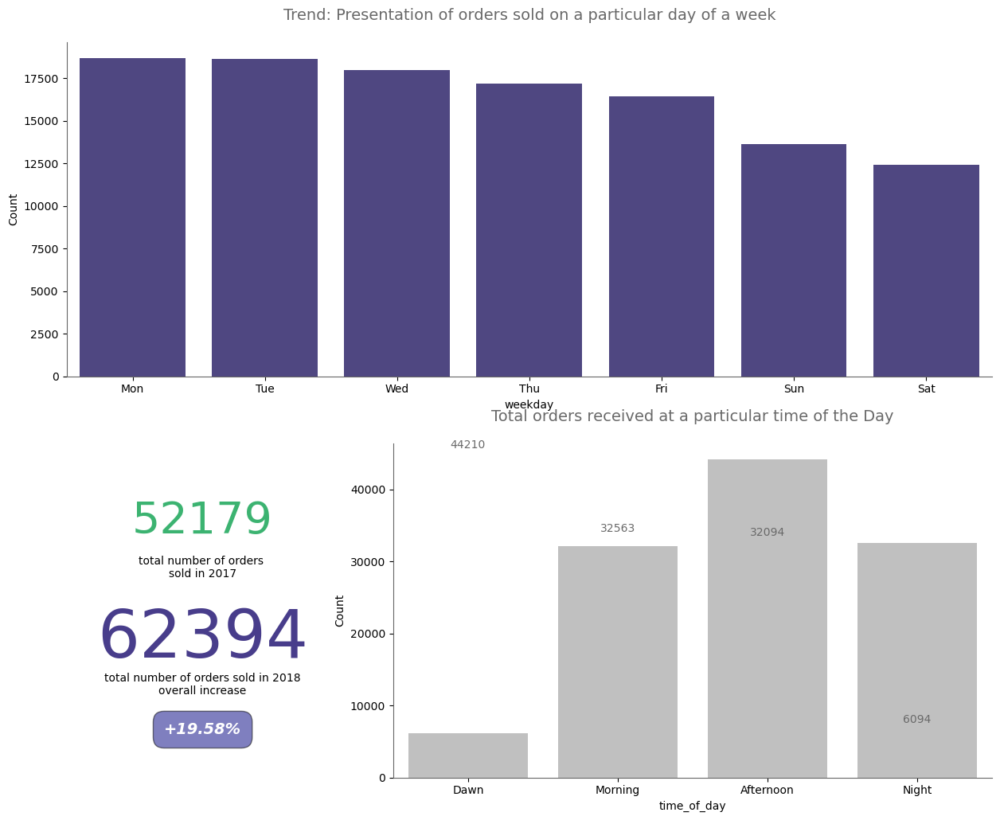

In [43]:
# Creating figure
fig = plt.figure(constrained_layout=False, figsize=(15, 12))

# Axis definition
gs = GridSpec(2, 3, figure=fig)
ax1 = fig.add_subplot(gs[0, :])
ax2 = fig.add_subplot(gs[1, 0])
ax3 = fig.add_subplot(gs[1, 1:])

# Plot 1 - Presentation of orders sold on a particular day of a week
sns.barplot(x='weekday', y='Count', ax=ax1, data=orders_by_dayofweek, linewidth=2, 
             color='darkslateblue', label='Days')

# Customizing the first plot
format_spines(ax1)
#for tick in ax1.get_xticklabels():
#    tick.set_rotation(45)
ax1.set_title('Trend: Presentation of orders sold on a particular day of a week', size=14, color='dimgrey', pad=20)
ax1.grid(False)


# Plot 2 - Change in the total orders received between 2017 and 2018
ax2.text(0.50, 0.73, str(orders_2017), fontsize=40, color='mediumseagreen', ha='center')
ax2.text(0.50, 0.60, 'total number of orders \nsold in 2017', fontsize=10, ha='center')
ax2.text(0.50, 0.36, str(orders_2018), fontsize=60, color='darkslateblue', ha='center')
ax2.text(0.50, 0.25, 'total number of orders sold in 2018\noverall increase', fontsize=10, ha='center')
signal = '+' if perc_change_orders > 0 else '-'
ax2.text(0.50, 0.13, f'{signal}{str(round(perc_change_orders, 2))}%', fontsize=14, ha='center', color='white', style='italic', weight='bold',
         bbox=dict(facecolor='navy', alpha=0.5, pad=10, boxstyle='round, pad=.7'))
ax2.axis('off')

# Plot 3 - Total orders received at a particular time of the Day
sns.barplot(x='time_of_day', y='Count', data=orders_by_daytime, linewidth=2, 
             color='silver', ax=ax3)
format_spines(ax3, right_border=False)
#for tick in ax3.get_xticklabels():
#    tick.set_rotation(45)
for x, y in orders_by_daytime.Count.items():
  ax3.annotate(round(y, 2), xy=(x, y), textcoords='offset points', xytext=(0, 10),
                ha='center', color='dimgrey')
ax3.set_title('Total orders received at a particular time of the Day', size=14, color='dimgrey', pad=20)
ax3.grid(False)
#pio.write_image(fig, "C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/Images/weekday.png",
#               width=1000, height=600)
#plt.savefig(
#        Path("C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/Images/weekday.png"),
#        bbox_inches="tight",
#        dpi=200,
#    )

plt.show()


In [44]:
# Merging the datasets
df6_geo = df6.merge(geo_location, how='left', left_on='customer_zip_code_prefix', 
                                        right_on='geolocation_zip_code_prefix')

In [45]:
# Filtering data between 201701 and 201808
df_orders_filt = df6_geo[(df6_geo['order_purchase_year_month'].astype(int) >= 201701)]
df_orders_filt = df_orders_filt[(df_orders_filt['order_purchase_year_month'].astype(int) <= 201808)]

# Grouping data
df_month_aggreg = df_orders_filt.groupby(by=['order_purchase_year', 'order_purchase_year_month'], as_index=False)
df_month_aggreg = df_month_aggreg.agg({
    'order_id': 'count',
    'price': 'sum',
    'Revenue': 'sum',
    'freight_value': 'sum'
})

# Adding new columns for analysis
df_month_aggreg['price_per_order'] = round(df_month_aggreg['price'] / df_month_aggreg['order_id'],2)
df_month_aggreg['freight_per_order'] = round(df_month_aggreg['freight_value'] / df_month_aggreg['order_id'],2)
df_month_aggreg.head()

,order_purchase_year,order_purchase_year_month,order_id,price,Revenue,freight_value,price_per_order,freight_per_order
0,2017,201701,1003,125456.98,165360.42,17757.10,125.08,17.70
1,2017,201702,2002,251147.70,314445.02,40236.71,125.45,20.10
2,2017,201703,3073,377463.92,476309.64,58535.85,122.83,19.05
3,2017,201704,2704,362806.79,453713.31,52054.01,134.17,19.25
4,2017,201705,4274,526331.63,665400.61,81754.08,123.15,19.13


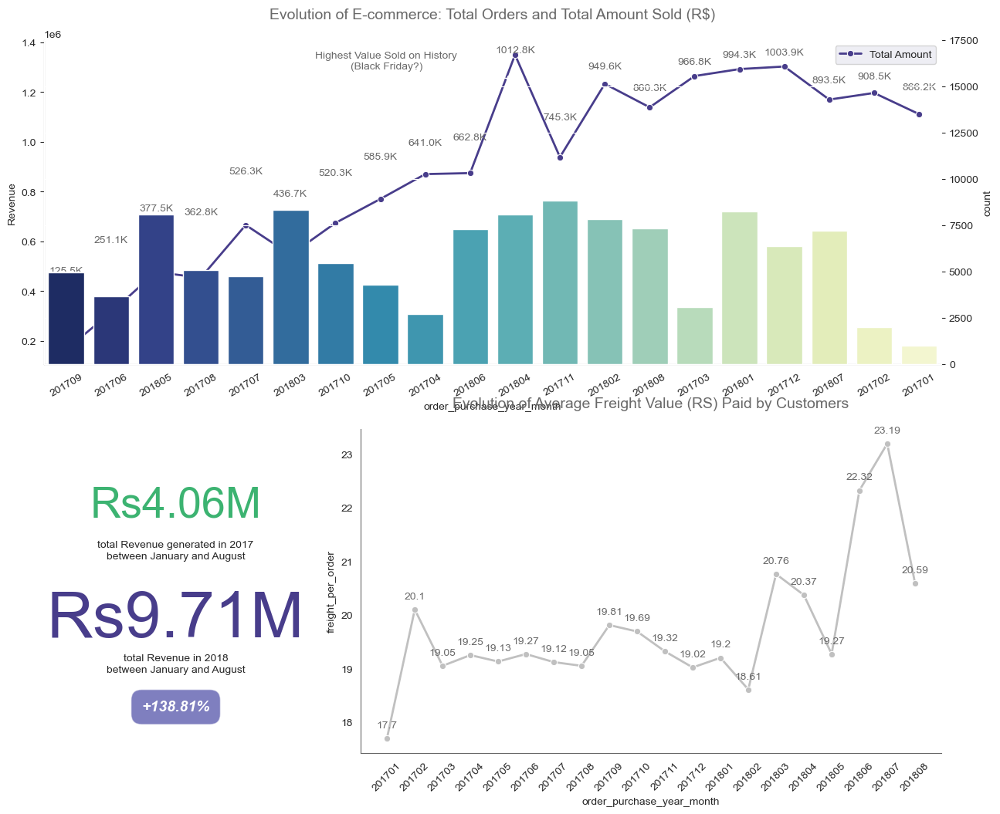

In [143]:
# Creating figure
fig = plt.figure(constrained_layout=False, figsize=(15, 12))

# Axis definition
gs = GridSpec(2, 3, figure=fig)
ax1 = fig.add_subplot(gs[0, :])
ax2 = fig.add_subplot(gs[1, 0])
ax3 = fig.add_subplot(gs[1, 1:])

# Plot 1 - Evolution of total orders and total sales on e-commerce
sns.lineplot(x='order_purchase_year_month', y='Revenue', ax=ax1, data=df_month_aggreg, linewidth=2, 
             color='darkslateblue', marker='o', label='Total Amount')
ax1_twx = ax1.twinx()
single_countplot(df_orders_filt, x='order_purchase_year_month', ax=ax1_twx, order=False, palette='YlGnBu_r')
ax1_twx.set_yticks(np.arange(0, 20000, 2500))

# Customizing the first plot
format_spines(ax1)
for tick in ax1.get_xticklabels():
    tick.set_rotation(30)
for x, y in df_month_aggreg.price.items():
    ax1.annotate(str(round(y/1000, 1))+'K', xy=(x, y), textcoords='offset points', xytext=(0, 80),
                ha='center', color='dimgrey')
ax1.annotate(f'Highest Value Sold on History\n(Black Friday?)', (10, 1250000), xytext=(-120, 10),
             textcoords='offset points', bbox=dict(boxstyle="round4", fc="w", pad=.8),
             arrowprops=dict(arrowstyle='-|>', fc='w', connectionstyle = 'arc3'), color='dimgrey', ha='center')
ax1.set_title('Evolution of E-commerce: Total Orders and Total Amount Sold (R$)', size=14, color='dimgrey', pad=20)

# Plot 2 - Big Numbers of Sales Evolution
month_comparison = ['201701', '201702', '201703', '201704', '201705', '201706', '201707', '201708',
                    '201801', '201802', '201803', '201804', '201805', '201806', '201807', '201808']
df_sales_compare = df_month_aggreg.query('order_purchase_year_month in (@month_comparison)')
sold_2017 = df_sales_compare[df_sales_compare['order_purchase_year']=='2017']['Revenue'].sum()
sold_2018 = df_sales_compare[df_sales_compare['order_purchase_year']=='2018']['Revenue'].sum()
growth = ( sold_2018 - sold_2017)/sold_2017
ax2.text(0.50, 0.73, 'Rs' + str(round(sold_2017/1000000, 2)) + 'M', fontsize=40, color='mediumseagreen', ha='center')
ax2.text(0.50, 0.60, 'total Revenue generated in 2017\nbetween January and August', fontsize=10, ha='center')
ax2.text(0.50, 0.36, 'Rs' + str(round(sold_2018/1000000, 2)) + 'M', fontsize=60, color='darkslateblue', ha='center')
ax2.text(0.50, 0.25, 'total Revenue in 2018\nbetween January and August', fontsize=10, ha='center')
signal = '+' if growth > 0 else '-'
ax2.text(0.50, 0.13, f'{signal}{str(round(100 * growth, 2))}%', fontsize=14, ha='center', color='white', style='italic', weight='bold',
         bbox=dict(facecolor='navy', alpha=0.5, pad=10, boxstyle='round, pad=.7'))
ax2.axis('off')

# Plot 3 - Evolution of mean freight value paid by the customers
sns.lineplot(x='order_purchase_year_month', y='freight_per_order', data=df_month_aggreg, linewidth=2, 
             color='silver', marker='o', ax=ax3)
format_spines(ax3, right_border=False)
for tick in ax3.get_xticklabels():
    tick.set_rotation(45)
for x, y in df_month_aggreg.freight_per_order.items():
  ax3.annotate(round(y, 2), xy=(x, y), textcoords='offset points', xytext=(0, 10),
                ha='center', color='dimgrey')
ax3.set_title('Evolution of Average Freight Value (RS) Paid by Customers', size=14, color='dimgrey', pad=20)

#plt.savefig(
#        Path("C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/Images/trend_rev_order.png"),
#        bbox_inches="tight",
#        dpi=200,
#    )

plt.show()


In [47]:
#Filtering data between Jan to Aug
year2017 = df6.loc[np.where((df6.order_purchase_year_month >= '201701') & (df6.order_purchase_year_month < '201709'))]
year2018 = df6.loc[np.where((df6.order_purchase_year_month >= '201801') & (df6.order_purchase_year_month < '201809'))]

#merging the above two datasets
filtered_year = pd.concat([year2017, year2018], axis=0)

In [48]:
#Total quantity sold in 2017 and 2018
tot_Qty_year = filtered_year.groupby(['order_purchase_year', 'order_purchase_year_month', 'order_purchase_month_name']).order_item_id.sum().reset_index().rename(columns={'order_purchase_year': 'Year', 'order_purchase_month_name': 'Month', 'order_item_id': 'Quantity'})

#Total Revenue generated in 2017 and 2018
tot_rev_year = filtered_year.groupby(['order_purchase_year', 'order_purchase_year_month', 'order_purchase_month_name']).Revenue.sum().reset_index().rename(columns={'order_purchase_year': 'Year', 'order_purchase_month_name': 'Month'})

<Axes: xlabel='Month', ylabel='Revenue'>

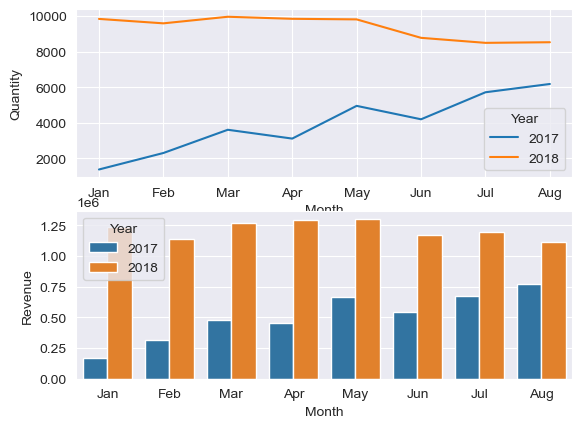

In [49]:
#define dimensions of subplots (rows, columns)
sns.set_style("darkgrid")
fig, axes = plt.subplots(2, 1)

#create chart in each subplot
sns.lineplot(data=tot_Qty_year, y='Quantity', x='Month', hue='Year', ax=axes[0])
sns.barplot(data=tot_rev_year, y='Revenue', x='Month', hue='Year', ax=axes[1])

In [50]:
#Segregating data year-wise
year_2017_location = df6_geo[(df6_geo['order_purchase_year'] == '2017') & (df6_geo['geolocation_state'] != 'Andhra Pradesh')]
year_2018_location = df6_geo[(df6_geo['order_purchase_year'] == '2018') & (df6_geo['geolocation_state'] != 'Andhra Pradesh')]

#We have remove Andhra Pradesh from the data just for the visualization purpose. Andhra Pradesh has the highest sold quantity

In [51]:
#getting quantity grouped by Location
qty_by_loc_2017 = year_2017_location.groupby('geolocation_state').order_item_id.sum().reset_index().rename(columns={'geolocation_state':'State','order_item_id':'Quantity'})
qty_by_loc_2018 = year_2018_location.groupby('geolocation_state').order_item_id.sum().reset_index().rename(columns={'geolocation_state':'State','order_item_id':'Quantity'})

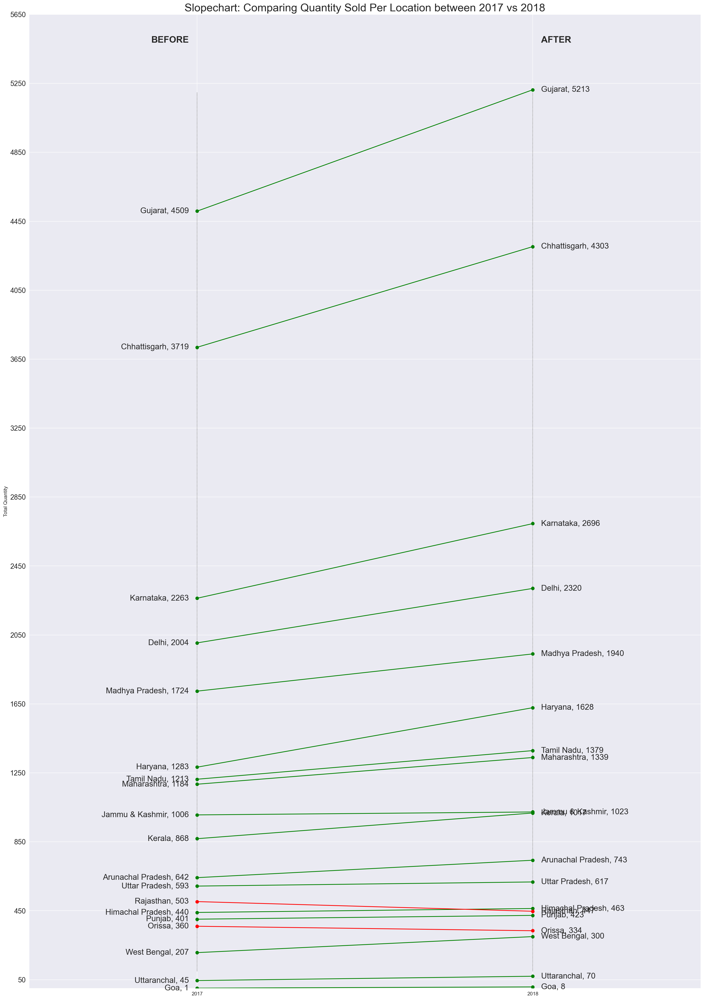

In [52]:
import matplotlib.lines as mlines
# Import Data

left_label = [str(c) + ', '+ str(round(y)) for c, y in zip(qty_by_loc_2017.State, qty_by_loc_2017['Quantity'])]
right_label = [str(c) + ', '+ str(round(y)) for c, y in zip(qty_by_loc_2018.State, qty_by_loc_2018['Quantity'])]
klass = ['red' if (y1-y2) < 0 else 'green' for y1, y2 in zip(qty_by_loc_2017['Quantity'], qty_by_loc_2018['Quantity'])]

# draw line
# https://stackoverflow.com/questions/36470343/how-to-draw-a-line-with-matplotlib/36479941
def newline(p1, p2, color='black'):
    ax = plt.gca()
    l = mlines.Line2D([p1[0],p2[0]], [p1[1],p2[1]], color='red' if p1[1]-p2[1] > 0 else 'green', marker='o', markersize=6)
    ax.add_line(l)
    return l

fig, ax = plt.subplots(1,1,figsize=(24,35), dpi= 150)

# Vertical Lines
ax.vlines(x=1, ymin=100, ymax=5200, color='black', alpha=0.7, linewidth=1, linestyles='dotted')
ax.vlines(x=3, ymin=100, ymax=5200, color='black', alpha=0.7, linewidth=1, linestyles='dotted')

# Points
ax.scatter(y=qty_by_loc_2017['Quantity'], x=np.repeat(1, qty_by_loc_2017.shape[0]), s=10, color='black', alpha=0.7)
ax.scatter(y=qty_by_loc_2018['Quantity'], x=np.repeat(3, qty_by_loc_2018.shape[0]), s=10, color='black', alpha=0.7)

# Line Segmentsand Annotation
for p1, p2, c in zip(qty_by_loc_2017['Quantity'], qty_by_loc_2018['Quantity'], qty_by_loc_2017['State']):
    newline([1,p1], [3,p2])
    ax.text(1-0.05, p1, c + ', ' + str(round(p1)), horizontalalignment='right', verticalalignment='center', fontdict={'size':16})
    ax.text(3+0.05, p2, c + ', ' + str(round(p2)), horizontalalignment='left', verticalalignment='center', fontdict={'size':16})

# 'Before' and 'After' Annotations
ax.text(1-0.05, 5500, 'BEFORE', horizontalalignment='right', verticalalignment='center', fontdict={'size':18, 'weight':700})
ax.text(3+0.05, 5500, 'AFTER', horizontalalignment='left', verticalalignment='center', fontdict={'size':18, 'weight':700})

# Decoration
ax.set_title("Slopechart: Comparing Quantity Sold Per Location between 2017 vs 2018", fontdict={'size':22})
ax.set(xlim=(0,4), ylim=(0,5500), ylabel='Total Quantity')
ax.set_xticks([1,3])
ax.set_xticklabels(["2017", "2018"])
plt.yticks(np.arange(50, 6000, 400), fontsize=14)

# Lighten borders
plt.gca().spines["top"].set_alpha(.0)
plt.gca().spines["bottom"].set_alpha(.0)
plt.gca().spines["right"].set_alpha(.0)
plt.gca().spines["left"].set_alpha(.0)

#plt.savefig(
#        Path("C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/Images/yr_states.png"),
#        bbox_inches="tight",
#        dpi=200,
#    )
plt.show()

In [53]:
#aggreagtion count every order_id
most_bought_product = df6.groupby('product_category_name').aggregate({'order_id':'count'}).rename(columns={'order_id':'order_count'}).sort_values(by='order_count',ascending=False).reset_index().rename(columns={'product_category_name': 'Category', 'order_count': 'Quantity'})

#product category most bought
most_bought_product.head(10).style.background_gradient(cmap='Blues')

,Category,Quantity
0,Bed Bath Table,11964
1,Health Beauty,9947
2,Sports Leisure,8802
3,Furniture Decor,8754
4,Computers Accessories,8024
5,Housewares,7260
6,Watches Gifts,6209
7,Telephony,4706
8,Garden Tools,4527
9,Auto,4363


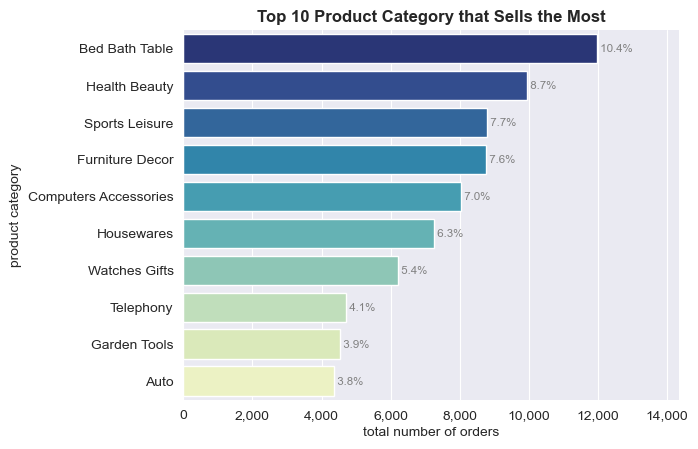

In [54]:
### Visualising top 10 most bought product categories:

ax = sns.barplot(x='Quantity',y='Category',data=most_bought_product[:10],palette="YlGnBu_r")
plt.ylabel("product category")
plt.xlabel("total number of orders")
plt.xticks(rotation='horizontal')
total = most_bought_product['Quantity'].sum()

#comma formatter
ax.get_xaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

#percantage
for c in ax.containers:
        labels = [f" {(value.get_width() / total):.1%}" for value in c]
        ax.bar_label(c, labels=labels, label_type="edge",fontsize='smaller', fontname='Sans',color='grey')    


for spine in ['top', 'right','bottom']:
    ax.spines[spine].set_visible(False)
    
ax.set_title(
        "Top 10 Product Category that Sells the Most",
        fontdict={"fontweight": "bold"},
    )

ax.set(
        xlim=(None, most_bought_product["Quantity"].max() * 1.2)
    )  # gives room for the annotations


plt.show()


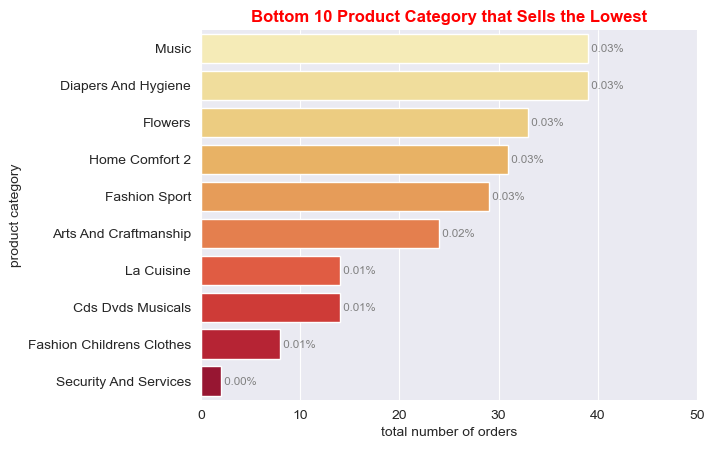

In [55]:
### Visualising top 10 lowest bought product categories:
ax = sns.barplot(x='Quantity',y='Category',data=most_bought_product.tail(10),palette="YlOrRd")
plt.ylabel("product category")
plt.xlabel("total number of orders")
plt.xticks(rotation='horizontal')
total = most_bought_product['Quantity'].sum()
#formmater comma
ax.get_xaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
#percantage
for c in ax.containers:
        labels = [f" {(value.get_width() / total):.2%}" for value in c]
        ax.bar_label(c, labels=labels, label_type="edge",fontsize='smaller', fontname='Sans',color='grey')    


for spine in ['top', 'right','bottom']:
    ax.spines[spine].set_visible(False)
    
ax.set_title(
        "Bottom 10 Product Category that Sells the Lowest",
        fontdict={"fontweight": "bold"},
        color='red'
    )

ax.set(
        xlim=(None, 50)
    )  # gives room for the annotations
plt.show()

### (f) Popular Products by month, seller, state, category

In [56]:
#Popular Product by Month
pop_product_by_month = df6_geo[['order_purchase_year_month', 'product_id', 'order_item_id']].groupby(['order_purchase_year_month', 'product_id']).sum().sort_values(['order_purchase_year_month','order_item_id'], ascending=[True,False]).reset_index().groupby(['order_purchase_year_month']).head(2).reset_index().drop(columns='index').rename(columns={'order_item_id': 'Quantity'})
pop_product_by_month.style.background_gradient(cmap='Blues')

,order_purchase_year_month,product_id,Quantity
0,201609,f293394c72c9b5fafd7023301fc21fc2,2
1,201609,c1488892604e4ba5cff5b4eb4d595400,1
2,201610,d9894482fba41f536a273ba2276d951f,21
3,201610,65bb78cf0bbc3ca6406f30e6793736f9,12
4,201612,f5d8f4fbc70ca2a0038b9a0010ed5cb0,1
5,201701,37eb69aca8718e843d897aa7b82f462d,120
6,201701,7c68e7297c7df2535c9f0dcd61007f64,32
7,201702,58efb9b638561ce132216a9a612513e2,24
8,201702,e251ebd2858be1aa7d9b2087a6992580,23
9,201703,7e0dc102074f8285580c9777f79c90cf,51


In [57]:
#popular products by seller
pop_product_by_seller = (df6_geo[['order_item_id','product_id', 'seller_id']].groupby(['seller_id', 'product_id']).sum().sort_values(['seller_id','order_item_id'], ascending=[True,False]).reset_index()).groupby(['seller_id']).head(3).reset_index().drop(columns='index')
pop_product_by_seller.style.background_gradient(cmap='Blues')

,seller_id,product_id,order_item_id
0,0015a82c2db000af6aaaf3ae2ecb0532,a2ff5a97bf95719e38ea2e3b4105bce8,3
1,001cca7ae9ae17fb1caed9dfb1094831,08574b074924071f4e201e151b152b4e,133
2,001cca7ae9ae17fb1caed9dfb1094831,e251ebd2858be1aa7d9b2087a6992580,67
3,001cca7ae9ae17fb1caed9dfb1094831,98a8c2fa16d7239c606640f5555768e4,33
4,001e6ad469a905060d959994f1b41e4f,093cd981b714bcdff182b427d87fc8fc,1
5,002100f778ceb8431b7a1020ff7ab48f,158102fe543dbaeb84d87811bfe06d0d,18
6,002100f778ceb8431b7a1020ff7ab48f,414c53fa9c5cc4a0390682aeb2e25ec1,17
7,002100f778ceb8431b7a1020ff7ab48f,2ceff1056fe5bd4ee443433402962fa4,3
8,004c9cd9d87a3c30c522c48c4fc07416,54af11c815f92135fb554bd9c97dd418,15
9,004c9cd9d87a3c30c522c48c4fc07416,fa94f25a73969e3a25d52706e246dfcc,12


In [58]:
#popular products by state
pop_product_by_state = (df6_geo[['order_item_id','product_id', 'geolocation_state']].groupby(['geolocation_state', 'product_id']).sum().sort_values(['geolocation_state','order_item_id'], ascending=[True,False]).reset_index()).groupby(['geolocation_state']).head(2).reset_index().drop(columns='index')
pop_product_by_state.style.background_gradient(cmap='Blues')

,geolocation_state,product_id,order_item_id
0,Andhra Pradesh,422879e10f46682990de24d770e7f83d,515
1,Andhra Pradesh,aca2eb7d00ea1a7b8ebd4e68314663af,443
2,Arunachal Pradesh,03e1c946c0ddfc58724ff262aef08dff,78
3,Arunachal Pradesh,7c68e7297c7df2535c9f0dcd61007f64,32
4,Chhattisgarh,44a5d24dd383324a421569ca697b13c2,105
5,Chhattisgarh,422879e10f46682990de24d770e7f83d,63
6,Delhi,54d7ad85b648d3cb2b7069ed446d7f35,41
7,Delhi,422879e10f46682990de24d770e7f83d,35
8,Goa,2a5806f10d0f00e5ad032dd2e3c8806e,1
9,Goa,3db53484d668b78b3bbefe2f430df477,1


In [59]:
#popular products by category
pop_product_by_cat = (df6_geo[['order_item_id','product_id', 'product_category_name']].groupby(['product_category_name', 'product_id']).sum().sort_values(['product_category_name','order_item_id'], ascending=[True,False]).reset_index()).groupby(['product_category_name']).head(2).reset_index().drop(columns='index')
pop_product_by_cat.style.background_gradient(cmap='Blues')

,product_category_name,product_id,order_item_id
0,Agro Industry And Commerce,11250b0d4b709fee92441c5f34122aed,56
1,Agro Industry And Commerce,c183fd5d2abf05873fa6e1014ed9e06c,21
2,Air Conditioning,f2a1b32f85cad59ff2a8444154ac25f0,30
3,Air Conditioning,98e91d0f32954dcd8505875bb2b42cdb,19
4,Art,4fe644d766c7566dbc46fb851363cb3b,113
5,Art,986700c98805af229ab7ad51b95fa356,22
6,Arts And Craftmanship,b9976e9c22fb1540bd71d1bcd2989475,5
7,Arts And Craftmanship,08c5c3d471845327e913b52aded0caf3,2
8,Audio,db5efde3ad0cc579b130d71c4b2db522,51
9,Audio,a59fb60fddcc72a9878b7ed5cb69d8e4,49


### (g) Popular categories by state, month

In [60]:
#popular categories by state
cat_by_state = (df6_geo[['geolocation_state', 'product_category_name', 'order_item_id']].groupby(['geolocation_state', 'product_category_name']).sum().sort_values(['geolocation_state', 'order_item_id'], ascending=[True, False]).reset_index()).groupby('geolocation_state').head(2).reset_index().drop(columns='index')

In [61]:
cat_by_state.style.background_gradient(cmap='Blues')

,geolocation_state,product_category_name,order_item_id
0,Andhra Pradesh,Bed Bath Table,9849
1,Andhra Pradesh,Furniture Decor,7775
2,Arunachal Pradesh,Furniture Decor,167
3,Arunachal Pradesh,Housewares,151
4,Chhattisgarh,Bed Bath Table,820
5,Chhattisgarh,Furniture Decor,804
6,Delhi,Furniture Decor,410
7,Delhi,Computers Accessories,371
8,Goa,Auto,1
9,Goa,Construction Tools Construction,1


In [62]:
#Popular categories by Month
pop_cat_by_month = df6[['order_purchase_year_month', 'product_category_name', 'order_item_id']].groupby(['order_purchase_year_month', 'product_category_name']).sum().sort_values(['order_purchase_year_month','order_item_id'], ascending=[True,False]).reset_index().groupby(['order_purchase_year_month']).head(2).reset_index().drop(columns='index')
round(pop_cat_by_month, 0).style.background_gradient(cmap='Blues')

,order_purchase_year_month,product_category_name,order_item_id
0,201609,Furniture Decor,3
1,201609,Telephony,1
2,201610,Furniture Decor,117
3,201610,Health Beauty,55
4,201612,Fashion Bags Accessories,1
5,201701,Furniture Decor,297
6,201701,Garden Tools,172
7,201702,Furniture Decor,342
8,201702,Bed Bath Table,213
9,201703,Furniture Decor,428


### (h) List top 10 most expensive products sorted by price

In [63]:
exp_products = df6_geo[['product_id', 'price']].groupby('product_id').mean().sort_values('price', ascending=False).reset_index().head(10)
exp_products

,product_id,price
0,489ae2aa008f021502940f251d4cce7f,6735.00
1,69c590f7ffc7bf8db97190b6cb6ed62e,6729.00
2,1bdf5e6731585cf01aa8169c7028d6ad,6499.00
3,a6492cc69376c469ab6f61d8f44de961,4799.00
4,c3ed642d592594bb648ff4a04cee2747,4690.00
5,259037a6a41845e455183f89c5035f18,4590.00
6,a1beef8f3992dbd4cd8726796aa69c53,4399.87
7,6cdf8fc1d741c76586d8b6b15e9eef30,4099.99
8,6902c1962dd19d540807d0ab8fade5c6,3999.90
9,4ca7b91a31637bd24fb8e559d5e015e4,3999.00


In [64]:
fig = go.Figure(go.Bar(y=exp_products['product_id'], x=exp_products['price'], # Need to revert x and y axis
                      orientation="h", text=exp_products['price'],
    textposition = "outside", marker={'color': exp_products['price'], 
    'colorscale': 'bluyl'})) 
fig.update_layout(title_text='10 MOST EXPENSIVE PRODUCTS',
                  xaxis_title="Price",yaxis_title="Products", 
                  width=1000, height=700, yaxis={'categoryorder':'total ascending'})
fig.show()

### 3. Cross-Selling (Which products are selling together)

In [65]:
#getting duplicate order IDs
duplicate_orders = df6_geo[df6_geo['order_id'].duplicated(keep=False)]

In [66]:
#creating product bundle
duplicate_orders['product_bundle']=duplicate_orders.groupby(by='order_id')['product_category_name'].transform(lambda x : ' '.join(map(str, x)))

In [67]:
duplicate_orders[['order_id','product_bundle']]

,order_id,product_bundle
7,c9ef97d2854afe64a3b4488bc2836af6,Cool Stuff Cool Stuff
8,c9ef97d2854afe64a3b4488bc2836af6,Cool Stuff Cool Stuff
9,df2d910b8b5e5f461f67043489f9569d,Cool Stuff Cool Stuff Cool Stuff
10,df2d910b8b5e5f461f67043489f9569d,Cool Stuff Cool Stuff Cool Stuff
11,df2d910b8b5e5f461f67043489f9569d,Cool Stuff Cool Stuff Cool Stuff
...,...,...
114952,fc32248629afaea92d59f7086de552d3,Housewares Housewares Housewares
114955,fd607d0a02cb276bc764a15f80f0423f,Furniture Decor Furniture Decor
114956,fd607d0a02cb276bc764a15f80f0423f,Furniture Decor Furniture Decor
114959,ff701a7c869ad21de22a6994237c8a00,Drinks Drinks


In [68]:
#dropping duplicate orders
unique_bundle = duplicate_orders[['order_id','product_bundle']].drop_duplicates()
unique_bundle

,order_id,product_bundle
7,c9ef97d2854afe64a3b4488bc2836af6,Cool Stuff Cool Stuff
9,df2d910b8b5e5f461f67043489f9569d,Cool Stuff Cool Stuff Cool Stuff
19,d829ae9ca5e0a9749f2574b62eb7ac10,Cool Stuff Cool Stuff
34,8fc1991bfbb78b4d939d11ffef79c398,Toys Toys
46,1a45c130db33df3cb0e3cd16f0a8ae9d,Cool Stuff Cool Stuff
...,...,...
114943,f8d4190f8951914e3d79e7b6b7871470,Stationery Stationery
114947,fbff77db5421bb7e1da292db45d07e75,Books Technical Books Technical
114950,fc32248629afaea92d59f7086de552d3,Housewares Housewares Housewares
114955,fd607d0a02cb276bc764a15f80f0423f,Furniture Decor Furniture Decor


In [69]:
#top 10 bundles with highest orders
unique_bundle.groupby(by='product_bundle').count().reset_index().sort_values('order_id',ascending=False).head(10)

,product_bundle,order_id
64,Bed Bath Table Bed Bath Table,1270
352,Furniture Decor Furniture Decor,925
681,Sports Leisure Sports Leisure,751
142,Computers Accessories Computers Accessories,706
458,Health Beauty Health Beauty,673
532,Housewares Housewares,610
418,Garden Tools Garden Tools,459
773,Watches Gifts Watches Gifts,350
727,Telephony Telephony,327
20,Auto Auto,280


In [70]:
# use itertools and collections libraries for count 
from itertools import combinations
from collections import Counter

count=Counter()

for row in unique_bundle['product_bundle']:
    row_list=row.split(' ')
    count.update(Counter(combinations(row_list,3)))

print("-------------------------------------------------------------------------------------------------------------------")
print ("Top 10 combinations of products are selling together in each transaction. (combination of 2 or 3 buying together)")
print("-------------------------------------------------------------------------------------------------------------------")
count.most_common(10)

-------------------------------------------------------------------------------------------------------------------
Top 10 combinations of products are selling together in each transaction. (combination of 2 or 3 buying together)
-------------------------------------------------------------------------------------------------------------------


[(('Bed', 'Bath', 'Table'), 38540),
 (('Bed', 'Bath', 'Bed'), 28208),
 (('Bed', 'Bath', 'Bath'), 28208),
 (('Bed', 'Table', 'Bed'), 28208),
 (('Bed', 'Table', 'Bath'), 28208),
 (('Bed', 'Table', 'Table'), 28208),
 (('Bed', 'Bed', 'Bath'), 28208),
 (('Bed', 'Bed', 'Table'), 28208),
 (('Bath', 'Table', 'Bed'), 28208),
 (('Bath', 'Table', 'Bath'), 28208)]

### 4. Payment Behaviour
### a. How customers are paying?
### b. Which payment channels are used by most customers?

In [71]:
#getting the unique orders only before calculating the payment behaviour 
filtered_df = df6[~df6['order_id'].duplicated()]

In [72]:
#Payment Preference by Transaction count
filtered_df[filtered_df.order_purchase_year_month >= '201701']['payment_type'].value_counts()

credit card    72548
UPI            19017
voucher         2561
debit card      1464
Name: payment_type, dtype: int64

In [73]:
#Payament Preference percentage share
card = filtered_df[filtered_df.order_purchase_year_month >= '201701']['payment_type'].value_counts(normalize=True).to_frame().reset_index().rename(columns={'index':'Card_type','payment_type':'Count'})
card['Count'] = round(card['Count']*100,2)

In [74]:
card

,Card_type,Count
0,credit card,75.89
1,UPI,19.89
2,voucher,2.68
3,debit card,1.53


In [75]:
fig = go.Figure([go.Pie(labels=card['Card_type'], values=card['Count']
                        ,hole=0.7)])  # can change the size of hole 

fig.update_traces(hoverinfo='label+percent', textinfo='percent', textfont_size=15)
fig.update_layout(title="Percentage of transactions by payment type (95899 total payments)",title_x=0.5, width=800, height=500)

#pio.write_image(fig, "C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/Images/payment_type_share.png",
#               width=1000, height=600)
fig.show()

In [76]:
payment_type_by_month = filtered_df[filtered_df.order_purchase_year_month >= '201701'].groupby(['order_purchase_year', 'order_purchase_year_month', 'payment_type']).order_id.count().reset_index().rename(columns={'order_purchase_year': 'Year', 'order_purchase_year_month': 'Year_Month', 'order_id': 'Count' })
payment_type_by_month.head()

,Year,Year_Month,payment_type,Count
0,2017,201701,UPI,191
1,2017,201701,credit card,546
2,2017,201701,debit card,9
3,2017,201701,voucher,26
4,2017,201702,UPI,372


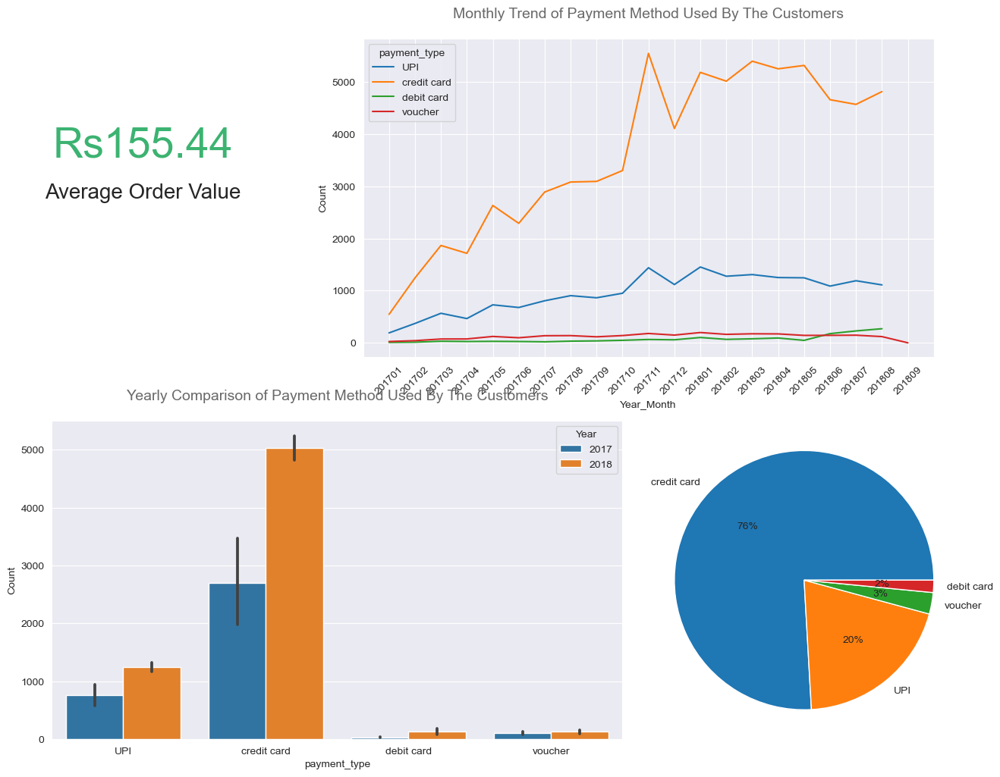

In [77]:
# Creating figure
fig = plt.figure(constrained_layout=False, figsize=(15, 12))

# Axis definition
gs = GridSpec(2, 3, figure=fig)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1:])
ax3 = fig.add_subplot(gs[1, :2])
ax4 = fig.add_subplot(gs[1, 2])

# Plot 1 - Average Order Value
ax1.text(0.35, 0.63, 'Rs' + str(round(df6.Revenue.mean(),2)), fontsize=40, color='mediumseagreen', ha='center')
ax1.text(0.35, 0.50, 'Average Order Value', fontsize=20, ha='center')
ax1.axis('off')

#Plot 2 - Monthly Trend of Payment Method used by the customers 
sns.lineplot(data=payment_type_by_month, y='Count', x='Year_Month', hue='payment_type', ax=ax2)
for tick in ax2.get_xticklabels():
    tick.set_rotation(45)
ax2.set_title('Monthly Trend of Payment Method Used By The Customers', size=14, color='dimgrey', pad=20)


#Plot 3 - Yearly Comparison of Payment Method Used By The Customers
sns.barplot(data=payment_type_by_month, y='Count', x='payment_type', hue='Year', ax=ax3)
ax3.set_title('Yearly Comparison of Payment Method Used By The Customers', size=14, color='dimgrey', pad=20)

#Plot 4 - Percentage share of Each Payment Method
plt.pie( x=card.Count, labels=card.Card_type, autopct='%.0f%%', radius=1.25)

#plt.savefig(
#        Path("C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/Images/payments_overview.png"),
#        bbox_inches="tight",
#        dpi=200,
#    )
plt.show()

## Average order value (AOV) 

In [78]:
average_order_value = round(df6.Revenue.mean(),2)
print('The average order value is Rs{}'.format(average_order_value))

The average order value is Rs155.44


In [79]:
# Group the payment type by its categories and find the mean of Revenue for each category.
# sort_values(ascending = False) orders the result in descending order
# reset_index convertes the result to a dataframe 
# name ='mean_payment_value' renames the new column created
average_payment_per_paymentmethod = round(df6.groupby('payment_type').Revenue.mean(),2).sort_values(ascending = False).reset_index().rename(columns={'payment_type': 'Payment_Method', 'Revenue': 'Average_Payment' })

# Show the result
average_payment_per_paymentmethod

,Payment_Method,Average_Payment
0,credit card,160.47
1,UPI,144.49
2,debit card,134.85
3,voucher,131.29


In [80]:
fig = px.bar(average_payment_per_paymentmethod, x='Payment_Method', y='Average_Payment',
             hover_data=['Average_Payment'], color='Average_Payment', height=400,  
             title="Average Payment Through Different Payment Methods")
fig.show()

#### Credit card has the highest average payment value, followed by UPI and debit card. Voucher accounts for the least average payment value.

### How does this value vary by product category

In [81]:
# Group the product_category_name by its categories and find the average Revenue for each category
avg_rev_per_cat = round(df6.groupby('product_category_name').Revenue.mean(),2).sort_values(ascending = False).reset_index().rename(columns={'product_category_name': 'Product_Category', 'Revenue': 'Average_Revenue' })
avg_rev_per_cat

# Select top 10 categories
top10_avg_rev_per_cat = avg_rev_per_cat.head(10)

In [82]:
fig = px.bar(top10_avg_rev_per_cat, y='Average_Revenue', x='Product_Category', text_auto='.2s', color = 'Average_Revenue',
            title="AVERAGE REVENUE BY PRODUCT CATEGORY")
fig.show()

#### Computers, Small appliances, fixed telephone, home appliances2, agro industry and commerce, musical instruments, small appliances,  construction toold safety, Office furniture and Air Conditioning are the highest product categories based on the average payment value.

#### However, Computers have the overall highest average payment value with a value of 1267.46

In [83]:
#Average Payment Grouped by Payment Type and Category
avg_payment_cat_by_type = round(df6.groupby(['payment_type', 'product_category_name']).payment_value.mean(),2).reset_index().rename(columns={'payment_value': 'Average_Payment'})
avg_payment_cat_by_type.head()

,payment_type,product_category_name,Average_Payment
0,UPI,Agro Industry And Commerce,920.46
1,UPI,Air Conditioning,259.45
2,UPI,Art,261.84
3,UPI,Arts And Craftmanship,110.06
4,UPI,Audio,117.68


In [84]:
install = df6['payment_installments'].value_counts().to_frame().reset_index().rename(columns={'index':'num', 'payment_installments':'Count'})

In [85]:
fig = go.Figure(go.Bar(
    x=install['num'],y=install['Count'],
    marker={'color': install['Count'], 
    'colorscale': 'Viridis'},  
    text=install['Count'],
    textposition = "outside"
))
fig.update_layout(title_text='Distribution of payment installments',xaxis_title="count",yaxis_title="Payment Installments", xaxis = dict(
        tickmode = 'linear'
    ))
fig.show()

### 5. Customer satisfaction towards category & product
### a. Which categories (top 10) are maximum rated & minimum rated?
### b. Which products (top10) are maximum rated & minimum rated?
### c. Average rating by location, seller, product, category, month etc

In [86]:
#Overall Average rating given by customers
overall_avg_rating = round(df6.review_score.mean(),0)
overall_avg_rating

4.0

In [87]:
fig = go.Figure(go.Indicator(
    mode = "gauge+number",
    value = overall_avg_rating,
    title = {'text': "Average Ratings"},
    gauge = {
        'axis': {'visible': False}},
    domain = {'x': [0, 1], 'y': [0, 1]}
))

#pio.write_image(fig, "C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/Images/overall_rating.png",
#               width=1000, height=600)

fig.show()

In [88]:
#Average Rating by Product Categories
avg_cat_ratings = round(df6.groupby('product_category_name').review_score.mean(),2).reset_index().rename(columns={'product_category_name':'Category', 'review_score': 'Score' })
avg_cat_ratings.head()

,Category,Score
0,Agro Industry And Commerce,4.15
1,Air Conditioning,3.91
2,Art,3.88
3,Arts And Craftmanship,4.12
4,Audio,3.82


In [89]:
#creating bucket
avg_cat_ratings['rating_bucket'] = np.where((avg_cat_ratings.Score >= 4.00) & (avg_cat_ratings.Score <= 5.00), '4 to 5',
                                         np.where((avg_cat_ratings.Score >= 3.00) & (avg_cat_ratings.Score < 4.00), '3 to 4',
                                                 np.where((avg_cat_ratings.Score >= 2.00) & (avg_cat_ratings.Score < 3.00), '2 to 3',
                                                         '1 to 2')))

In [90]:
#Number of categories by rating
tot_cat_by_rating = avg_cat_ratings.groupby('rating_bucket').Category.count().reset_index()
tot_cat_by_rating

,rating_bucket,Category
0,2 to 3,1
1,3 to 4,26
2,4 to 5,44


In [91]:
#top 10 product categories which have maximum average ratings
ratings_top10_cat = round(df6[['product_category_name', 'review_score']].groupby('product_category_name').mean(),2).sort_values('review_score', ascending=False).head(10)
ratings_top10_cat

,review_score
product_category_name,
Cds Dvds Musicals,4.64
Fashion Childrens Clothes,4.50
Books General Interest,4.43
Books Imported,4.42
Books Technical,4.35
Costruction Tools Tools,4.33
Small Appliances Home Oven And Coffee,4.32
Food Drink,4.31
Luggage Accessories,4.28


In [92]:
#Bottom 10 product categories which have minimum average ratings
ratings_bottom10_cat = round(df6[['product_category_name', 'review_score']].groupby('product_category_name').mean(),2).sort_values('review_score', ascending = True).head(10)
ratings_bottom10_cat

,review_score
product_category_name,
Security And Services,2.50
Diapers And Hygiene,3.26
Home Comfort 2,3.39
Office Furniture,3.46
Fashion Male Clothing,3.53
Fixed Telephony,3.66
Fashio Female Clothing,3.78
La Cuisine,3.79
Furniture Mattress And Upholstery,3.80


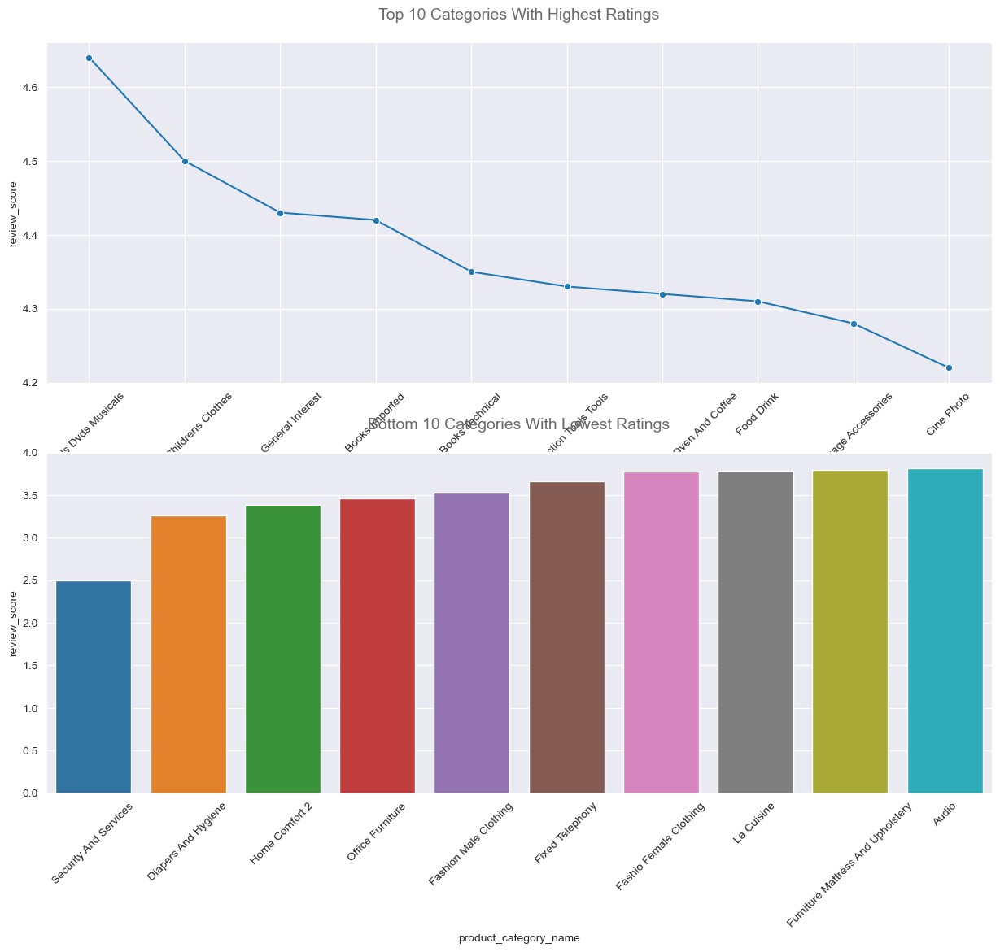

In [93]:
# Creating figure
fig = plt.figure(constrained_layout=False, figsize=(15, 12))

# Axis definition
gs = GridSpec(2, 3, figure=fig)
ax1 = fig.add_subplot(gs[0, 0:])
ax2 = fig.add_subplot(gs[1, 0:])

#Plot 1 - Top 10 Categories With Highest Ratings 
sns.lineplot(data=ratings_top10_cat, y='review_score', x=ratings_top10_cat.index, ax=ax1, marker='o', label='Average Freight Cost', legend = False)
for tick in ax1.get_xticklabels():
    tick.set_rotation(45)
ax1.set_title('Top 10 Categories With Highest Ratings', size=14, color='dimgrey', pad=20)

#Plot 2 - Bottom 10 Categories With Lowest Ratings 
sns.barplot(data=ratings_bottom10_cat, y='review_score', x=ratings_bottom10_cat.index, ax=ax2)
for tick in ax2.get_xticklabels():
    tick.set_rotation(45)
ax2.set_title('Bottom 10 Categories With Lowest Ratings', size=14, color='dimgrey', pad=20)

#plt.savefig(
#        Path("C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/Images/.png"),
#        bbox_inches="tight",
#        dpi=200,
#    )
plt.show()

In [94]:
#top 10 product which have maximum ratings 
df6.groupby(['product_id', 'review_score']).review_score.count().reset_index(name='count').sort_values(['review_score','count'], ascending=[False,False]).head(10)

,product_id,review_score,count
12622,422879e10f46682990de24d770e7f83d,5,281
32466,aca2eb7d00ea1a7b8ebd4e68314663af,5,272
28863,99a4788cb24856965c36a24e339b6058,5,257
10763,389d119b48cf3043d311335e499d9c6b,5,244
15919,53759a2ecddad2bb87a079a1f1519f73,5,217
10327,368c6c730842d78016ad823897a372db,5,216
39585,d1c427060a0f73f6b889a5c7c61f2ac4,5,208
15961,53b36df67ebb7c41585e8d54d6772e08,5,197
4066,154e7e31ebfa092203795c972e5804a6,5,192
11775,3dd2a17168ec895c781a9191c1e95ad7,5,165


In [95]:
#Bottom 10 product which have minimum ratings
df6.groupby(['product_id', 'review_score']).review_score.count().reset_index(name='count').sort_values(['review_score','count'], ascending=[True,False]).head(10)

,product_id,review_score,count
12618,422879e10f46682990de24d770e7f83d,1,85
10323,368c6c730842d78016ad823897a372db,1,69
28859,99a4788cb24856965c36a24e339b6058,1,69
15915,53759a2ecddad2bb87a079a1f1519f73,1,66
43175,e53e557d5a159f5aa2c5e995dfdf244b,1,54
32462,aca2eb7d00ea1a7b8ebd4e68314663af,1,52
39581,d1c427060a0f73f6b889a5c7c61f2ac4,1,50
10759,389d119b48cf3043d311335e499d9c6b,1,46
34077,b532349fe46b38fbc7bb3914c1bdae07,1,46
10405,36f60d45225e60c7da4558b070ce4b60,1,43


In [96]:
#Average Rating by Products
avg_rating_product = df6_geo[['product_id', 'review_score']].groupby('product_id').mean().reset_index()
avg_rating_product.head()

,product_id,review_score
0,00066f42aeeb9f3007548bb9d3f33c38,5.0
1,00088930e925c41fd95ebfe695fd2655,4.0
2,0009406fd7479715e4bef61dd91f2462,1.0
3,000b8f95fcb9e0096488278317764d19,5.0
4,000d9be29b5207b54e86aa1b1ac54872,5.0


In [97]:
#Average rating by location
avg_rating_location = round(df6_geo[['customer_city', 'review_score']].groupby('customer_city').mean(),2).reset_index()
avg_rating_location

,customer_city,review_score
0,Aadityana,4.06
1,Aambaliyasan,3.50
2,Aantaliya,3.87
3,Aarambhada,3.56
4,Abiramam,5.00
...,...,...
4067,Zamin Uthukuli,4.00
4068,Ziauddin Pur,4.07
4069,Zira,4.60
4070,Zirakpur,4.50


In [98]:
#Average rating and Locations Analysis
##Creating rating bucket
avg_rating_location['rating_bucket'] = np.where((avg_rating_location.review_score >= 4.00) & (avg_rating_location.review_score <= 5.00), '4 to 5',
                                         np.where((avg_rating_location.review_score >= 3.00) & (avg_rating_location.review_score < 4.00), '3 to 4',
                                                 np.where((avg_rating_location.review_score >= 2.00) & (avg_rating_location.review_score < 3.00), '2 to 3',
                                                         '1 to 2')))

In [99]:
#Total cities by each rating bucket
cat_by_rating = avg_rating_location.groupby('rating_bucket').customer_city.count().reset_index().rename(columns={'customer_city': 'Total_City'})

#percentage share
cat_by_rating['percent'] = round((cat_by_rating.Total_City/cat_by_rating.Total_City.sum())*100,2)

cat_by_rating

,rating_bucket,Total_City,percent
0,1 to 2,128,3.14
1,2 to 3,169,4.15
2,3 to 4,938,23.04
3,4 to 5,2837,69.67


In [100]:
#saving table
fig = go.Figure(data=[
                     go.Table(
                        header=dict(values=list(cat_by_rating.columns),align='center'),
                        cells=dict(values=cat_by_rating.values.transpose(),
                                   fill_color = [["white","lightgrey"]*cat_by_rating.shape[0]],
                                   align='center'
                                  )
                            )
                       ])
#fig.write_image("C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/Images/table.png",width=500, height=300)


### Sellers

In [101]:
#Average Rating by Sellers
avg_rating_seller = round(df6_geo[['seller_id', 'review_score']].groupby('seller_id').mean(),2).reset_index()
avg_rating_seller

,seller_id,review_score
0,0015a82c2db000af6aaaf3ae2ecb0532,3.67
1,001cca7ae9ae17fb1caed9dfb1094831,3.88
2,001e6ad469a905060d959994f1b41e4f,1.00
3,002100f778ceb8431b7a1020ff7ab48f,4.03
4,004c9cd9d87a3c30c522c48c4fc07416,4.09
...,...,...
2971,ffcfefa19b08742c5d315f2791395ee5,1.00
2972,ffdd9f82b9a447f6f8d4b91554cc7dd3,4.29
2973,ffeee66ac5d5a62fe688b9d26f83f534,4.21
2974,fffd5413c0700ac820c7069d66d98c89,3.84


### Top Active Sellers

In [102]:
# Group the sellers by seller id and find the count of order id for each seller id. 
active_sellers = df6.groupby('seller_id').order_id.count().sort_values(ascending = False).reset_index().rename(columns = {'seller_id': 'seller', 'order_id': 'Order_Count' })

# Show the result
active_sellers.head(10)

,seller,Order_Count
0,4a3ca9315b744ce9f8e9374361493884,2155
1,6560211a19b47992c3666cc44a7e94c0,2130
2,1f50f920176fa81dab994f9023523100,2017
3,cc419e0650a3c5ba77189a1882b7556a,1893
4,da8622b14eb17ae2831f4ac5b9dab84a,1662
5,955fee9216a65b617aa5c0531780ce60,1530
6,1025f0e2d44d7041d6cf58b6550e0bfa,1477
7,7c67e1448b00f6e969d365cea6b010ab,1463
8,7a67c85e85bb2ce8582c35f2203ad736,1245
9,ea8482cd71df3c1969d7b9473ff13abc,1240


#### The above table shows the top 10 most active sellers based on how many orders they have gotten.

### Distribution of seller ratings and its impact sales performance

In [103]:
# Group the seller_id column by each individual seller and find the average review score for each seller
seller_review_score  = round(df6.groupby('seller_id').review_score.agg(['mean', 'count']), 0).reset_index().rename(columns={'mean' : 'review_score', 'count':'Count'})

# Show the result
seller_review_score

,seller_id,review_score,Count
0,0015a82c2db000af6aaaf3ae2ecb0532,4.0,3
1,001cca7ae9ae17fb1caed9dfb1094831,4.0,241
2,001e6ad469a905060d959994f1b41e4f,1.0,1
3,002100f778ceb8431b7a1020ff7ab48f,4.0,59
4,004c9cd9d87a3c30c522c48c4fc07416,4.0,171
...,...,...,...
2971,ffcfefa19b08742c5d315f2791395ee5,1.0,1
2972,ffdd9f82b9a447f6f8d4b91554cc7dd3,4.0,21
2973,ffeee66ac5d5a62fe688b9d26f83f534,4.0,14
2974,fffd5413c0700ac820c7069d66d98c89,4.0,62


In [104]:
#Seller: Ratings and Count of Orders received
sellers_totOrders_byRating = seller_review_score.groupby('review_score').Count.sum().sort_values(ascending = False).reset_index()
sellers_totOrders_byRating

,review_score,Count
0,4.0,98320
1,3.0,7917
2,5.0,7797
3,2.0,622
4,1.0,305


#### Sellers with high ratings have received high number of orders whereas sellers with low rating are getting low number of orders

In [105]:
# Group the review score column by its ratings and find the number of sellers placed under each rating 
grouped_reviewscore_bysellers = seller_review_score.groupby('review_score').seller_id.count().sort_values(ascending = False).reset_index().rename(columns={'seller_id': 'Total_Sellers'})


# Show the result
grouped_reviewscore_bysellers 

,review_score,Total_Sellers
0,4.0,1546
1,5.0,853
2,3.0,300
3,1.0,155
4,2.0,122


In [106]:
# Group the review score column by its ratings and find number of orders that recieve each rating
orders_by_reviewscore = df6.groupby('review_score')['order_id'].count().sort_values(ascending = False).reset_index().rename(columns = {'order_id': 'Order_Count'})

orders_by_reviewscore

,review_score,Order_Count
0,5,64570
1,4,21702
2,1,14876
3,3,9734
4,2,4079


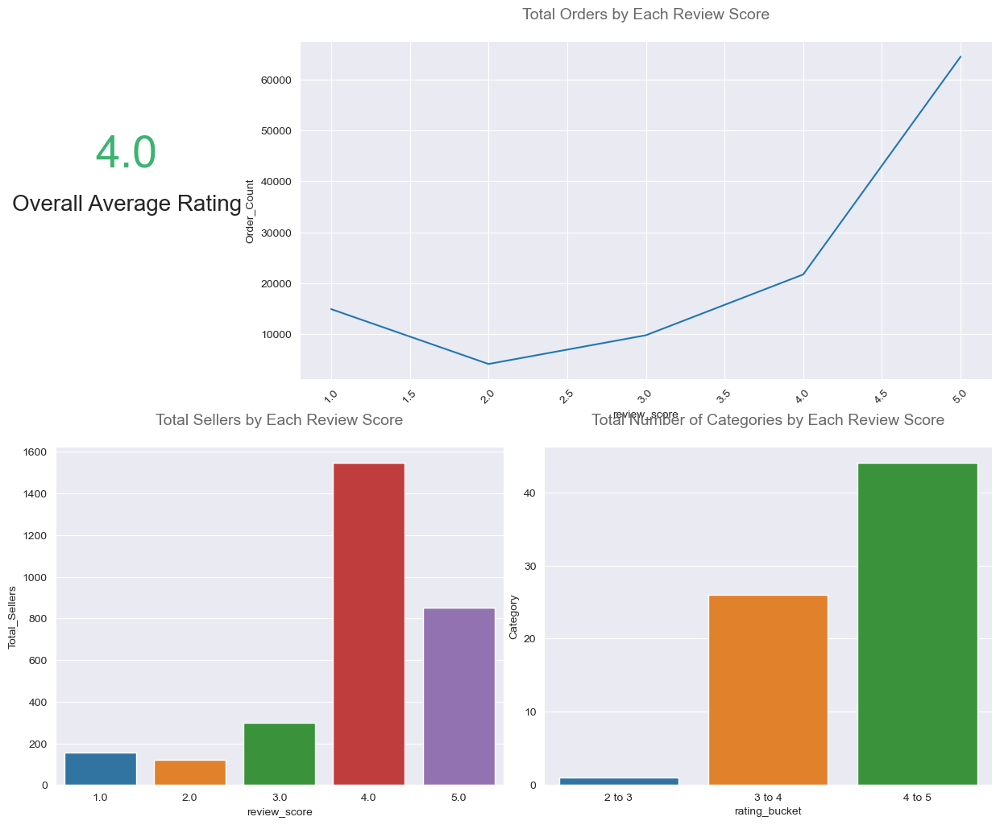

In [107]:
# Creating figure
fig = plt.figure(constrained_layout=False, figsize=(15, 12))

# Axis definition
gs = GridSpec(2, 4, figure=fig)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1:])
ax3 = fig.add_subplot(gs[1, :2])
ax4 = fig.add_subplot(gs[1, 2:])

# Plot 1 - Overall Average Rating
ax1.text(0.35, 0.63, str((overall_avg_rating)), fontsize=40, color='mediumseagreen', ha='center')
ax1.text(0.35, 0.50, 'Overall Average Rating', fontsize=20, ha='center')
ax1.axis('off')


#Plot 2 - Total Orders by Each Review Score
sns.lineplot(data=orders_by_reviewscore, y='Order_Count', x='review_score', ax=ax2)
for tick in ax2.get_xticklabels():
    tick.set_rotation(45)
ax2.set_title('Total Orders by Each Review Score', size=14, color='dimgrey', pad=20)


#Plot 3 - Total Sellers by Each Review Score
sns.barplot(data=grouped_reviewscore_bysellers, y='Total_Sellers', x='review_score', ax=ax3)
ax3.set_title('Total Sellers by Each Review Score', size=14, color='dimgrey', pad=20)

#Plot 4 - Total Categories by Each Review Score
sns.barplot(data=tot_cat_by_rating, y='Category', x='rating_bucket', ax=ax4)
ax4.set_title('Total Number of Categories by Each Review Score', size=14, color='dimgrey', pad=20)

#plt.savefig(
#        Path("C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/Images/ratings_overview.png"),
#        bbox_inches="tight",
#        dpi=200,
#    )
plt.show()

### Average Customer Rating For Products Sold

In [108]:
average_rating = round(df6['review_score'].mean(), 0)
print('The average customer rating for all orders is {}'.format(average_rating))

The average customer rating for all orders is 4.0


## Total Cancelled Orders and Its Impact On the Company's Revenue

In [109]:
# Filter the dataframe to show only rows with canceled and unavailable order status and find the how many rows are present
total_canceled_orders = len(df6[(df6['order_status'] == 'canceled') | (df6['order_status'] == 'unavailable')])

print('The total number of canceled orders is {}'.format(total_canceled_orders))

The total number of canceled orders is 554


In [110]:
#Filter the dataframe to show only rows with canceled and unavailable order status and find the sum of the Revenue for these rows
canceled_order_amount = round(df6[(df6['order_status'] == 'canceled') | (df6['order_status'] == 'unavailable')].Revenue.sum(), 2)

# Find the percentage loss due to canceled orders
all_revenue = df6.Revenue.sum()
percentage_loss = round((canceled_order_amount/all_revenue)*100,2)

print('Company lost {} due to cancelled orders'.format(canceled_order_amount))
print("The company lost {}% of it's revenue due to cancelled orders".format(percentage_loss))

Company lost 131831.75 due to cancelled orders
The company lost 0.74% of it's revenue due to cancelled orders


In [111]:
#Few more calculation for visualisation purpose only
tot_rev_in_perc = round((all_revenue/all_revenue)*100, 2)

net_rev_perc = round(((all_revenue - canceled_order_amount)/all_revenue)*100, 2)

In [112]:
fig = go.Figure()


fig.add_trace(go.Indicator(
    mode = "gauge+number",
    value = total_canceled_orders,
    domain = {'x': [0, 0.5], 'y': [0, 0.4]},
    title = {'text': "Total Number of Orders Cancelled"},
       gauge = {
        'axis': {'visible': False}}))

fig.add_trace(go.Indicator(
    mode = "gauge+number",
    value = canceled_order_amount,
    domain = {'x': [0, 0.5], 'y': [0.65, 1]},
    title = {'text': "Total Amount Lost Due to Cancellations"},
       gauge = {
        'axis': {'visible': False}}))


fig.add_trace(go.Indicator(
    mode = "gauge+number",
    value = percentage_loss,
    domain = {'x': [0.5, 1], 'y': [0, 1]},
    title = {'text': "Total Revenue Loss (%)"},
     gauge = {
        'axis': {'visible': False}}
))

#pio.write_image(fig, "C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/Images/overview_cancel.png",
#               width=1000, height=600)

fig.show()

In [113]:
fig = go.Figure()

fig.add_trace(go.Indicator(
    mode = "gauge+number",
    value = canceled_order_amount,
    title = {'text': "Total Amount Lost Due to Cancellations"},
       gauge = {
        'axis': {'visible': False}},
    domain = {'row': 0, 'column': 0}))


fig.add_trace(go.Indicator(
    mode = "delta",
    value = tot_rev_in_perc,
    domain = {'row': 0, 'column': 1}))

fig.update_layout(
    grid = {'rows': 1, 'columns': 2, 'pattern': "independent"},
    template = {'data' : {'indicator': [{
        'title': {'text': "% Share of Total Revenue Lost"},
        'mode' : "number+delta+gauge",
        'delta' : {'reference': net_rev_perc, 'increasing':{'color':"red"}, 'decreasing':{'color': "green"}}}]
                         }})


In [114]:
#dataframe consisting of only cancelled or unavailable order status
df_canceled_order = df6[(df6['order_status'] == 'canceled') | (df6['order_status'] == 'unavailable')]

In [115]:
#calculating the difference between purchase date and estimated delivery date
df_canceled_order['days_diff'] = (df_canceled_order.order_estimated_delivery_date - df_canceled_order.order_purchase_timestamp).dt.days

In [116]:
#Lets check the minimum, maximum and average difference of days
min_diff = round(df_canceled_order.days_diff.min(),2)

print('In case of Cancelled Orders, the minimum difference of days between the purchase date and the estimated delivery date is',min_diff)

max_diff = round(df_canceled_order.days_diff.max(),2)
print('maximum difference of days between the purchase date and the estimated delivery date is', max_diff)

avg_diff = round(df_canceled_order.days_diff.mean(),2)
print('average difference of days between the purchase date and the estimated delivery date is', avg_diff )

In case of Cancelled Orders, the minimum difference of days between the purchase date and the estimated delivery date is 2
maximum difference of days between the purchase date and the estimated delivery date is 144
average difference of days between the purchase date and the estimated delivery date is 22.47


In [117]:
fig = go.Figure()

fig.add_trace(go.Indicator(
    mode = "gauge+number",
    value = avg_diff,
    title = {'text': "Average Delay in Delivery (Days)"},
    gauge = {
        'axis': {'visible': False}},
    domain = {'x': [0.5, 1], 'y': [0, 1]}))

fig.add_trace(go.Indicator(
    mode = "gauge+number",
    value = max_diff,
    title = {'text': "Maximum Delay"},
       gauge = {
        'axis': {'visible': False}},
    domain = {'x': [0, 0.5], 'y': [0.65, 1]}))


fig.add_trace(go.Indicator(
    mode = "gauge+number",
    value = min_diff,
    title = {'text': "Minimum Delay"},
    gauge = {
        'axis': {'visible': False}},
    domain = {'x': [0, 0.5], 'y': [0, 0.4]}))


#pio.write_image(fig, "C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/Images/delay_in_days.png",
#               width=1000, height=600)

fig.show()

In [118]:
#Lets find the categories where orders are cancelled

In [119]:
#Top 10 categories where cancellation is high
cat_high_cancellation = df_canceled_order.product_category_name.value_counts().head(10).reset_index().rename(columns={'index': 'Category', 'product_category_name': 'Total Orders'})

In [120]:
# Drawing the bar plot
fig = px.bar(cat_high_cancellation, y='Total Orders', x='Category', text_auto='.2s', color='Total Orders',
            title="TOP 10 CATEGORIES WITH HIGH CANCELLATION ORDERS")

#pio.write_image(fig, "C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/Images/top_categories_highCancellation.png",
#               width=1000, height=600)
fig.show()

## Customer Density By Location

In [121]:
orders_join_customers = pd.merge(left = orders, right = customers, on = 'customer_id', how = 'left')

In [122]:
customers_density = df6_geo.groupby('customer_state').order_id.count().sort_values(ascending = False).reset_index().rename(columns={'order_id': 'count'})
customers_density.head()

,customer_state,count
0,Andhra Pradesh,70691
1,Gujarat,8631
2,Chhattisgarh,7221
3,Karnataka,4454
4,Delhi,3824


In [123]:
# Drawing the bar plot
fig = px.bar(customers_density, y='count', x='customer_state', text_auto='.2s', color='count',
            title="CUSTOMER DENSITY BY LOCATION")
fig.show()

# Delayed Orders

In [124]:
df6['is_delayed'] = df6['order_delivered_customer_date'] > df6['order_estimated_delivery_date']

In [125]:
#Filter the dataframe to show only rows with delayed order and find the total count of such orders
Total_Delays = df6.loc[(df6.is_delayed == True)].order_id.nunique()

# Find the percentage of delayed orders
Total_orders = df6.order_id.nunique()
percentage_delay = round((Total_Delays/Total_orders)*100,2)

print('Total number of orders which are delivered late are{}'.format(Total_Delays))
print("Percentage share of Delayed order out of total orders is {}%".format(percentage_delay))

Total number of orders which are delivered late are7588
Percentage share of Delayed order out of total orders is 7.91%


In [126]:
#Few more calculation for visualisation purpose only
tot_orders_in_perc = round((Total_orders/Total_orders)*100, 2)

ontime_orders_perc = round(((Total_orders - Total_Delays)/Total_orders)*100, 2)

In [127]:
fig = go.Figure()

fig.add_trace(go.Indicator(
    mode = "gauge+number",
    value = Total_Delays,
    title = {'text': "Late Orders"},
       gauge = {
        'axis': {'visible': False}},
    domain = {'row': 0, 'column': 0}))


fig.add_trace(go.Indicator(
    mode = "delta",
    value = tot_orders_in_perc,
    domain = {'row': 0, 'column': 1}))

fig.update_layout(
    grid = {'rows': 1, 'columns': 2, 'pattern': "independent"},
    template = {'data' : {'indicator': [{
        'title': {'text': "% Share of Total Orders"},
        'mode' : "number+delta+gauge",
        'delta' : {'reference': ontime_orders_perc, 'increasing':{'color':"red"}, 'decreasing':{'color': "green"}}}]
                         }})

#pio.write_image(fig, "C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/Images/Delay.png",
#               width=1000, height=600)


In [128]:
#Finding out top 10 cities with major delays in order
top10_city_wise_delay = df6.loc[(df6.is_delayed == True)].groupby('customer_city').order_id.count().sort_values(ascending = False).reset_index().rename(columns={'customer_city': 'City', 'order_id': 'Count' }).head(10)
top10_city_wise_delay

#Percentage share of top 10 cities in the Total delayed orders
top10_sum = top10_city_wise_delay.Count.sum()
percentage = round((top10_sum/Total_Delays)*100, 2)

In [129]:
delay_state_city = df6.loc[(df6.is_delayed == True)].groupby(['customer_state', 'customer_city']).order_id.count().sort_values(ascending = False).reset_index().head(20)

In [130]:
trend_delays = df6.loc[(df6.is_delayed == True)].groupby('order_purchase_year_month').order_id.count().reset_index().rename(columns={'order_id': 'Count'})

In [131]:
#defining visualizaition functions
def format_spines(ax, right_border=True):
    
    ax.spines['bottom'].set_color('#666666')
    ax.spines['left'].set_color('#666666')
    ax.spines['top'].set_visible(False)
    if right_border:
        ax.spines['right'].set_color('#FFFFFF')
    else:
        ax.spines['right'].set_color('#FFFFFF')
    ax.patch.set_facecolor('#FFFFFF')
    

def single_countplot(df, ax, x=None, y=None, order=True, hue=False, palette='plasma', width=0.75, sub_width=0.3,
                     sub_size=12):
    """
    Parâmetros
    ----------
    classifiers: conjunto de classificadores em forma de dicionário [dict]
    X: array com os dados a serem utilizados no treinamento [np.array]
    y: array com o vetor target do modelo [np.array]

    Retorno
    -------
    None
    """

    # Verificando plotagem por quebra de alguma variável categórica
    ncount = len(df)
    if x:
        col = x
    else:
        col = y
    if hue != False:
        if order:
            sns.countplot(x=x, y=y, data=df, palette=palette, ax=ax, order=df[col].value_counts().index, hue=hue)
        else:
            sns.countplot(x=x, y=y, data=df, palette=palette, ax=ax, hue=hue)
    else:
        if order:
            sns.countplot(x=x, y=y, data=df, palette=palette, ax=ax, order=df[col].value_counts().index)
        else:
            sns.countplot(x=x, y=y, data=df, palette=palette, ax=ax)


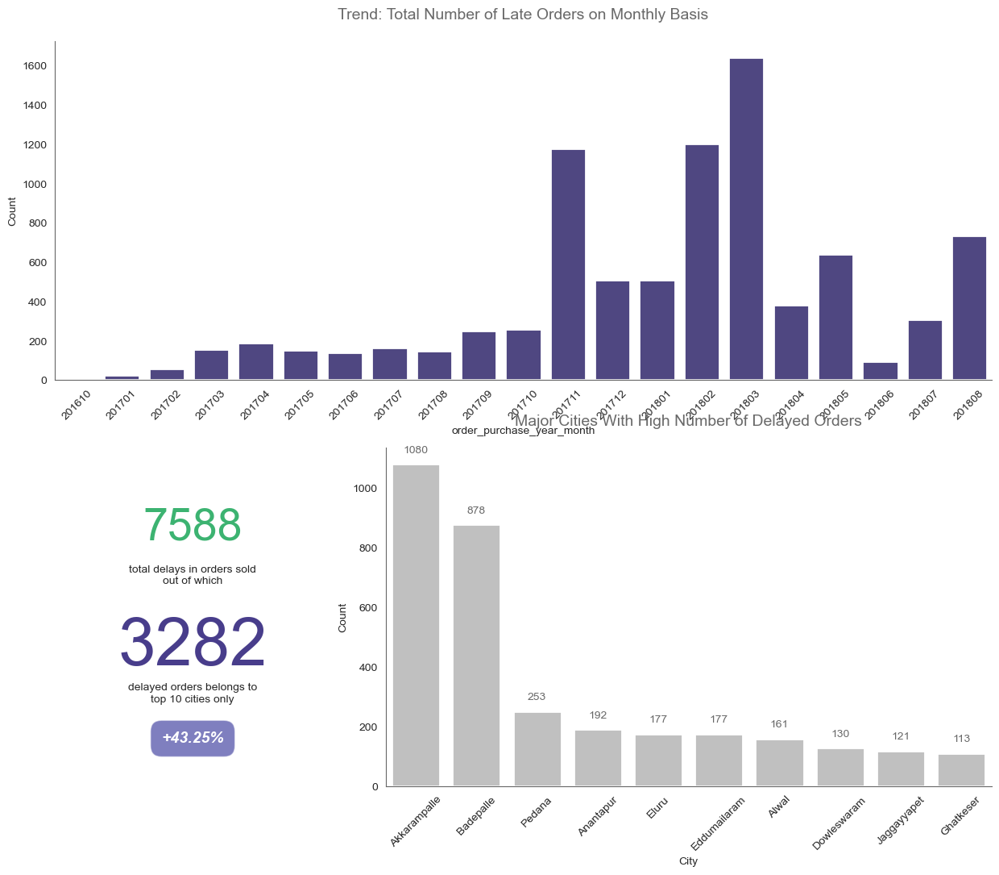

In [132]:
# Creating figure
fig = plt.figure(constrained_layout=False, figsize=(15, 12))

# Axis definition
gs = GridSpec(2, 3, figure=fig)
ax1 = fig.add_subplot(gs[0, :])
ax2 = fig.add_subplot(gs[1, 0])
ax3 = fig.add_subplot(gs[1, 1:])

# Plot 1 - Monthly Trend of Late Orders 
sns.barplot(x='order_purchase_year_month', y='Count', ax=ax1, data=trend_delays, linewidth=2, 
             color='darkslateblue', label='Monthly Delayed Orders')

# Customizing the first plot
format_spines(ax1)
for tick in ax1.get_xticklabels():
    tick.set_rotation(45)
ax1.set_title('Trend: Total Number of Late Orders on Monthly Basis', size=14, color='dimgrey', pad=20)
ax1.grid(False)


# Plot 2 - Big Numbers of Comparison Between Total Delay and Top 10 Cities
ax2.text(0.50, 0.73, str(round(Total_Delays)), fontsize=40, color='mediumseagreen', ha='center')
ax2.text(0.50, 0.60, 'total delays in orders sold\nout of which', fontsize=10, ha='center')
ax2.text(0.50, 0.36, str(round(top10_sum)), fontsize=60, color='darkslateblue', ha='center')
ax2.text(0.50, 0.25, 'delayed orders belongs to\ntop 10 cities only', fontsize=10, ha='center')
signal = '+' if percentage > 0 else '-'
ax2.text(0.50, 0.13, f'{signal}{str(round(percentage, 2))}%', fontsize=14, ha='center', color='white', style='italic', weight='bold',
         bbox=dict(facecolor='navy', alpha=0.5, pad=10, boxstyle='round, pad=.7'))
ax2.axis('off')

# Plot 3 - Top 10 Cities with Delayed Order
sns.barplot(x='City', y='Count', data=top10_city_wise_delay, linewidth=2, 
             color='silver', ax=ax3)
format_spines(ax3, right_border=False)
for tick in ax3.get_xticklabels():
    tick.set_rotation(45)
for x, y in top10_city_wise_delay.Count.items():
  ax3.annotate(round(y, 2), xy=(x, y), textcoords='offset points', xytext=(0, 10),
                ha='center', color='dimgrey')
ax3.set_title('Major Cities With High Number of Delayed Orders', size=14, color='dimgrey', pad=20)
ax3.grid(False)

#plt.savefig(
#        Path("C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/Images/overview_delay.png"),
#        bbox_inches="tight",
#        dpi=200,
#    )
plt.show()


## FREIGHTS

In [133]:
#Freight Costs as a Percent of Revenue
tot_freight_to_rev = round((df6.freight_value.sum()/Total_Revenue)*100,2)
tot_freight_to_rev

12.83

In [134]:
fig = go.Figure(go.Indicator(
    mode = "gauge+number",
    value = tot_freight_to_rev,
    title = {'text': "Total Freight Costs to Revenue"},
    domain = {'x': [0, 1], 'y': [0, 1]}
))

fig.show()

In [135]:
#Category: Average Freight Cost out of Total Revenue
avgfreight_to_revenue = round((df6.groupby('product_category_name').freight_value.mean()/df6.groupby('product_category_name').Revenue.mean())*100,2).reset_index().rename(columns={'product_category_name': 'Category', 0: 'percent'}).sort_values(by='percent', ascending = False)
avgfreight_to_revenue

,Category,percent
46,Home Comfort 2,32.14
35,Flowers,28.00
41,Furniture Mattress And Upholstery,26.15
12,Christmas Supplies,22.20
11,Cds Dvds Musicals,21.53
...,...,...
19,Construction Tools Safety,7.15
0,Agro Industry And Commerce,6.08
64,Small Appliances Home Oven And Coffee,5.50
14,Computers,3.79


In [136]:
#Average Freight Cost by Category
avg_freight_Cat = round(df6.groupby('product_category_name').freight_value.mean(),2).reset_index().rename(columns={'product_category_name': 'Category', 'freight_value': 'Average_Freight_Cost'}).sort_values(by='Average_Freight_Cost', ascending = False)
avg_freight_Cat.head(10)

,Category,Average_Freight_Cost
14,Computers,48.01
45,Home Appliances 2,45.97
38,Furniture Bedroom,44.18
51,Kitchen Dining Laundry Garden Furniture,42.59
41,Furniture Mattress And Upholstery,41.77
57,Office Furniture,38.44
64,Small Appliances Home Oven And Coffee,36.98
40,Furniture Living Room,35.77
62,Signaling And Security,32.62
50,Industry Commerce And Business,29.33


In [137]:
avg_freight_statewise = round(df6.groupby('customer_state').freight_value.mean(),2).reset_index().rename(columns={'customer_state': 'State', 'freight_value': 'Average_Freight_Cost'}).sort_values(by='Average_Freight_Cost', ascending = False)

#top 10 states with high freight cost
top_state_freight = avg_freight_statewise.head(10)

#bottom 10 states where demand is low
demand_by_states = df6.groupby('customer_state').order_id.nunique().reset_index().rename(columns={'customer_state': 'State', 'order_id': 'Total_Orders' }).sort_values(by='Total_Orders', ascending=False)
bottom_state_orderwise = demand_by_states.tail(10)

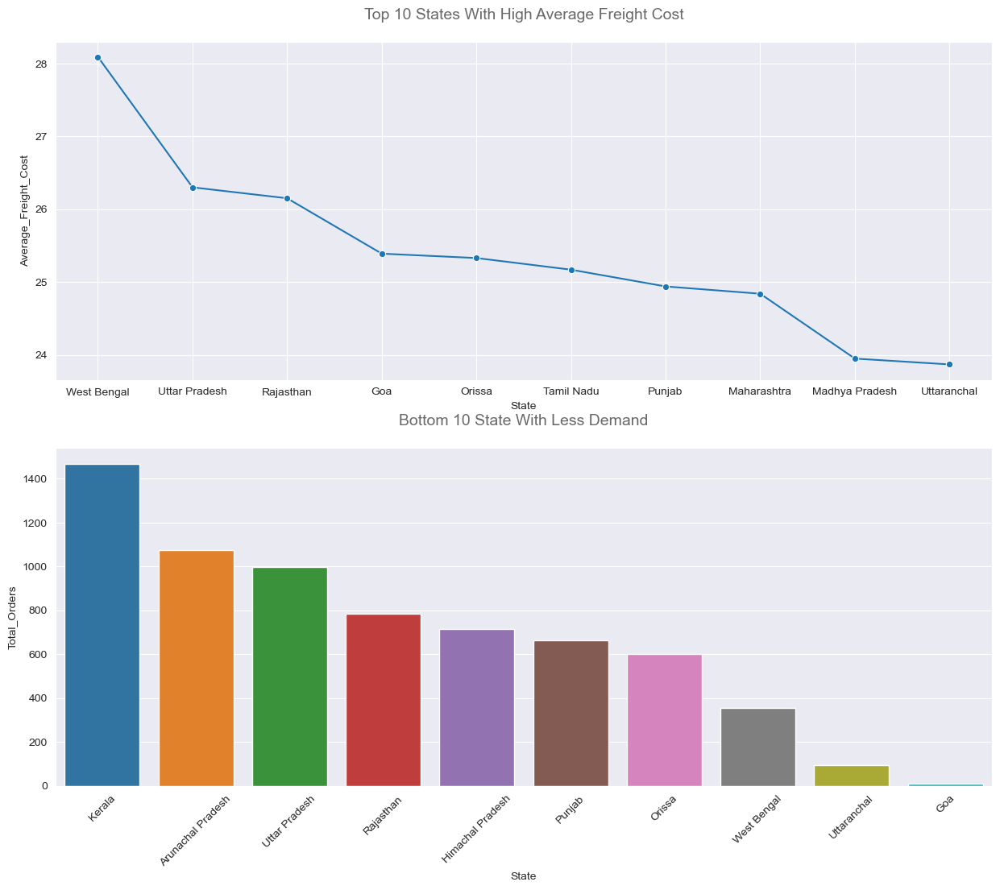

In [138]:
# Creating figure
fig = plt.figure(constrained_layout=False, figsize=(15, 12))

# Axis definition
gs = GridSpec(2, 3, figure=fig)
ax1 = fig.add_subplot(gs[0, 0:])
ax2 = fig.add_subplot(gs[1, 0:])

#Plot 1 - Top 10 States With High Average Freight Cost 
sns.lineplot(data=top_state_freight, y='Average_Freight_Cost', x='State', ax=ax1, marker='o', label='Average Freight Cost', legend = False)
for tick in ax2.get_xticklabels():
    tick.set_rotation(45)
ax1.set_title('Top 10 States With High Average Freight Cost', size=14, color='dimgrey', pad=20)

#Plot 2 - State With Less Demand
sns.barplot(data=bottom_state_orderwise, y='Total_Orders', x='State', ax=ax2)
ax2.set_title('Bottom 10 State With Less Demand', size=14, color='dimgrey', pad=20)

#plt.savefig(
#        Path("C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/Images/High_freight_low_demand.png"),
#        bbox_inches="tight",
#        dpi=200,
#    )
plt.show()

In [139]:
#Monthly Average Freight Cost
freight_monthly_trend = round(df6[(df6.order_purchase_year_month >= '201701')].groupby('order_purchase_year_month').freight_value.mean(),2).reset_index().rename(columns={'order_purchase_year_month': 'Month_Year', 'freight_value': 'Average Freight Cost' })

### Average Delivery Time

In [140]:
#calculating the difference between purchase date and estimated delivery date
df6['days_diff'] = (df6.order_estimated_delivery_date - df6.order_purchase_timestamp).dt.days

In [141]:
avg_deliveryTime = round(df6.days_diff.mean(),2)
print('The average delivery time of the order is {}'.format(avg_deliveryTime), 'Days')

The average delivery time of the order is 23.53 Days


In [142]:
# Creating figure
fig = plt.figure(constrained_layout=False, figsize=(15, 15))
fig = go.Figure()

# Add monthly freight cost chart
fig.add_trace(
    go.Line(x=freight_monthly_trend.Month_Year,
           y=freight_monthly_trend['Average Freight Cost'],
            #title = {'text': "Trend: Monthly Average Freight Cost "},
           marker=dict(color="crimson"),            
           showlegend=False )
)

fig1 = plt.figure(constrained_layout=False, figsize=(15, 15))
fig1 = go.Figure()

#adding Average Delivery Time visual
fig1.add_trace(go.Indicator(
    mode = "gauge+number",
    value = avg_deliveryTime,
    title = {'text': "Average Delivery Time (Days)"},
       gauge = {
        'axis': {'visible': False}},
    domain = {'row': 0, 'column': 0}))

#adding Average Frieght Cost to Revenue visual
fig1.add_trace(go.Indicator(
    mode = "number+gauge",
    value = tot_freight_to_rev,
    title = {'text': "Total Freight Costs to Revenue (%)"},
    gauge = {
        'axis': {'visible': False}},
    domain = {'row': 0, 'column': 1}))

#Updating Figure
fig.update_layout(
        title = "Trend: Monthly Average Freight Cost",
        xaxis_title="Month-Year",
        yaxis_title="Average Freight Cost",
   )

fig1.update_layout(
    grid = {'rows': 1, 'columns': 2, 'pattern': "independent"},
    template = {'data' : {'indicator': [{
        'title': {'text': "% Share of Total Orders"},
        'mode' : "number+delta+gauge"
    }]
                         }})
#Saving image
#pio.write_image(fig, "C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/Images/monthly_avg_freight_cost.png",
#               width=1000, height=600)
#pio.write_image(fig1, "C:/Users/ACER PC/Desktop/ANALYTIX_LAB/Python Class Notes/End to End Case Study_E-Commerce Analytics Project/Images/deliveryTime_Freight_to_Rev.png",
#               width=1000, height=600)

fig.show()
fig1.show()

<Figure size 1500x1500 with 0 Axes>

<Figure size 1500x1500 with 0 Axes>